# World Data League 2023

## 🎯 Challenge
*Avencas Marine Protected Area: Predict the future of the local ecosystem and its species*


## Team: CEOS
## 👥 Authors
* Ana Maria Sousa
* Duarte Rodrigues
* Mariana Sousa
* Mariana Xavier
* Ricardo Brioso

## 💻 Development

It is estimated that almost 1000 species of marine animals get impacted by ocean pollution. Moreover, around 37% of all marine mammals are at risk of extinction. Our goal is to understand the influence of environmental variables on the biodiversity and abundance of species in the local marine ecosystems as well as to predict future developments with a special focus on endangered and invasive species.

To achieve that, we were provided with one dataset collected from the Avencas Marine Protected Area (AMPA) containing:

* A list of the species observed in the area with the indication of conservation status or invasiveness, for sessil or mobil species respectivelly;

* The abundance of each mobil specie between 2011-2020;

* The coverage (%) of each sessil specie between 2011-2020.











### Imports and requirements

In [ ]:
# Imports

import os
import ephem
import torch
import random
import joblib
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import torch.optim as optim
import matplotlib.pyplot as plt
from torch import nn
from google.colab import drive
from xgboost import XGBRegressor
from datetime import date, datetime, time
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import LabelEncoder, MultiLabelBinarizer
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.inspection import PartialDependenceDisplay, permutation_importance
from sklearn.model_selection import train_test_split, PredefinedSplit, GridSearchCV

pd.set_option('mode.chained_assignment', None)
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

In [ ]:
# Mount google drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


### Functions

In [ ]:
def seed_everything(seed):
  ''' Seed random variables to ensure reproducibility. '''

  random.seed(seed)
  os.environ['PYTHONHASHSEED'] = str(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = True

seed_everything(123)

In [ ]:
def divide_by(x, max_value, divisor):
  ''' Function to divide a number by an input divisor until it is below an input max value. '''

  while x >= max_value:
    x = x/divisor

  return x

def convert_datetime_to_str(value):
  ''' Function to convert the time of a datetime value to string. '''

  if isinstance(value, datetime):
    return value.time().strftime("%H:%M")
  else:
    return value

def preprocess_dataframe(df):
  ''' Function to preprocess the dataframe according to the data issues found. '''

  # Drop rows with nan values (special care due to excel formatting)
  df = df.dropna(how='any')

  # Deal with date inconsistencies: wrong formmating and invalid date removal
  if '14-10-2015' in df['Date'].unique():
    df = df.replace({'Date': {'14-10-2015': '2015-10-14'}})
  df = df.loc[df['Date'] != '23-04-01-2020']
  df['Date'] =  pd.to_datetime(df['Date'], format='%Y-%m-%d')

  # Deal with hour problems: wrong types, characters and formulations
  df['Hour'] = df['Hour'].apply(lambda x: time(hour=int(x*24), minute=int(((x*24)-int(x*24))*60), second=0) if (not isinstance(x, time) and not isinstance(x, str)) else x)
  df['Hour'] = df['Hour'].apply(lambda x: datetime.strptime(x, '%H.%M').time() if (not isinstance(x, time) and isinstance(x, str) and '.' in x) else x)
  df['Hour'] = df['Hour'].apply(lambda x: datetime.strptime(x, '%H:%M').time() if (not isinstance(x, time) and isinstance(x, str) and ':' in x) else x)

  # Join date and hour in unique column and sort dataframe
  df['Datetime'] = df.apply(lambda r: pd.datetime.combine(r['Date'], r['Hour']), 1)
  df = df.drop(columns=['Date', 'Hour'])
  df = df[['Datetime'] + [col for col in df.columns if col != 'Datetime']]
  df = df.sort_values(by='Datetime')

  # Deal with tide inconsistencies: wrong number separation characters, blank spaces and extremely high unrealistic values
  df['Tide'] = df['Tide'].astype(str)
  df['Tide'] = df['Tide'].str.replace(';', '.').str.replace(',', '.').str.strip()
  df['Tide'] = df['Tide'].astype(float)
  df['Tide'] = df['Tide'].apply(lambda x: divide_by(x, max_value=1.5, divisor=10))

  # Deal with water temperature inconsistencies: wrong number separation characters, defining missing values as NaN, deleting outliers (0 temperature)
  df['Water temperature (ºC)'] = df['Water temperature (ºC)'].astype(str)
  df['Water temperature (ºC)'] = df['Water temperature (ºC)'].replace([';', ','], '.').replace(['-'], '')
  nan_indices = []
  for i in df['Water temperature (ºC)'].keys():
    try:
      df.loc[i, 'Water temperature (ºC)'] = float(df.loc[i, 'Water temperature (ºC)'])
    except ValueError:
      nan_indices.append(i)
      df.loc[i, 'Water temperature (ºC)'] = np.nan
  df = df.drop(nan_indices)
  zero_indices = df.index[df['Water temperature (ºC)'] == 0].tolist()
  df = df.drop(zero_indices)
  df['Water temperature (ºC)'] = df['Water temperature (ºC)'].astype(float)

  # Deal with zone inconsistencies: blank spaces
  df['Zone'] = df['Zone'].astype(str)
  df['Zone'] = df['Zone'].str.strip()

  # Deal with supratidal/middle intertidal inconsistencies: lower/uppercase inconsistencies, typos and blank spaces
  df['Supratidal/Middle Intertidal']=df['Supratidal/Middle Intertidal'].apply(lambda x: 'supra' if 'sup' in x.lower() else ('medium' if 'med' in x.lower() else x))


  # Creating a dictionary of 'Substrate'
  # Deal with substrate inconsistencies: expand the substrate column into multiple binary columns for each substrate
  uniq_sub = df['Substrate'].str.lower().str.split(pat='/', n=-1, expand=False).explode('Substrate').str.strip().unique().tolist()
  uniq_sub = [x for x in uniq_sub if isinstance(x, str)]
  dct = dict(map(lambda i: (i, uniq_sub[i]), range(len(uniq_sub)))) # Result dict of substracts {0: 'puddle', 1: 'rock', 2: 'sand', 3: 'pebble', 4: 'canal', 5: 'sea' , 6: 'high tide'}

  # Encode 'Substrate' column accordingly with dictionary
  df['Substrate'] = df['Substrate'].str.lower().str.split(pat='/', n=-1, expand=False)
  encod_list_encod = list()
  for i in df['Substrate'].keys():
    if(type(df.loc[i,'Substrate']) == list):
      encod_sub = [list(dct.values()).index(x.strip()) for x in df.loc[i,'Substrate']] # creating a list of keys, corresponding to coded subtractes
      encod_sub = [5 if x == 6 else x for x in encod_sub] # Change values 6 to 5 since sea and high tide are assumed as the same
      encod_list_encod.append(encod_sub)
    else:
      encod_list_encod.append([])
  df['Substrate_encoded'] = encod_list_encod

  mlb = MultiLabelBinarizer() # Encoding in Multi Label binary way and split in different columns
  binary_data = mlb.fit_transform(df['Substrate_encoded'])
  binary_columns = pd.DataFrame(binary_data, index=df.index, columns=['puddle', 'rock', 'sand', 'pebble', 'canal', 'sea'])
  df = df.join(binary_columns,how='inner')
  df=df.drop(columns=['Substrate', 'Substrate_encoded'])

  # Deal with coverage inconsistencies: incorrect float number separation characters, read as datetime
  if 'Coverage (%)' in df.columns:
    for i in df['Coverage (%)'].keys():
      value = convert_datetime_to_str(df.loc[i, 'Coverage (%)'])
      df.loc[i, 'Coverage (%)'] = value
    df['Coverage (%)']  = df['Coverage (%)'].astype(str)
    df['Coverage (%)']= df['Coverage (%)'].str.replace(':', '.').str.replace(',', '.').str.strip()
    df['Coverage (%)'] = df['Coverage (%)'].astype(float)

  return df



In [ ]:
def add_season(df):
  ''' Function to add a season column to the input dataframe (containing column 'Datetime'). '''

  # Define limits of each season
  Y = 2000 # Dummy leap year to allow input X-02-29 (leap day)
  seasons_limits = [('winter', (pd.Timestamp(date(Y, 1, 1)), pd.Timestamp(date(Y, 3, 20)))),
                    ('spring', (pd.Timestamp(date(Y, 3, 21)), pd.Timestamp(date(Y, 6, 20)))),
                    ('summer', (pd.Timestamp(date(Y, 6, 21)), pd.Timestamp(date(Y, 9, 22)))),
                    ('autumn', (pd.Timestamp(date(Y, 9, 23)), pd.Timestamp(date(Y, 12, 20)))),
                    ('winter', (pd.Timestamp(date(Y, 12, 21)), pd.Timestamp(date(Y, 12, 31))))]

  # Ensure datetime column is in correct format
  df['Datetime'] =  pd.to_datetime(df['Datetime'], format='%Y-%m-%d %H:%M:%S')

  # Get date column from dataframe
  dates = df['Datetime'].tolist()

  # Loop through existing dates to retrieve season information
  seasons = []
  for curr_date in dates:
    curr_date = curr_date.replace(year=Y).replace(hour=0).replace(minute=0).replace(second=0)
    seasons.append(next(season for season, (start, end) in seasons_limits if start <= curr_date <= end))

  # Add seasons to the initial dataframe
  df['Season'] = seasons

  return df

# See it in action
print('Functioning of add_season:')
df = pd.DataFrame(pd.date_range(start='2022-01-01 00:00:00', end='2022-12-31 23:45:00', freq='8h'), columns=['Datetime'])
df['Datetime'] =  pd.to_datetime(df['Datetime'], format='%Y-%m-%d %H:%M:%S')
df = add_season(df)
df.sample(n=10, random_state=123).sort_values(by='Datetime')

Functioning of add_season:


,Datetime,Season
221,2022-03-15 16:00:00,winter
228,2022-03-18 00:00:00,winter
282,2022-04-05 00:00:00,spring
453,2022-06-01 00:00:00,spring
476,2022-06-08 16:00:00,spring
578,2022-07-12 16:00:00,summer
580,2022-07-13 08:00:00,summer
691,2022-08-19 08:00:00,summer
783,2022-09-19 00:00:00,summer
873,2022-10-19 00:00:00,autumn


In [ ]:
def get_moon_phase_ephem(date):
  ''' Function to calculate the moon phase as the percentage illuminated for an input date using PyEphem [1]. '''

  # Get moon phase - percentage illuminated
  moon = ephem.Moon()
  moon.compute(date)
  phase = moon.phase

  return phase

def get_moon_phase(percentage, prev_percentage='NaN', eps=0.5):
  '''
  Function that calculates the moon phase based on the illuminated percentage and the previous moon phase.
  Considering an input buffer around the percentages.
  '''

  # New Moon is at 0%
  if 0 < percentage < 0+eps:
    return 'New Moon'

  # Full Moon is at 100%
  if 100-eps <= percentage < 100:
    return 'Full Moon'

  # The remaining phases depend not only on the illuminated percentage but also the previous one
  if prev_percentage == 'NaN':
    return 'NaN'

  # First/Third Quarter phases are both at 50 %, depending if the percentage is becoming higher or lower
  if 50-eps <= percentage < 50+eps:
    if percentage > prev_percentage:
      return 'First Quarter'
    if percentage < prev_percentage:
      return 'Third Quarter'

  # Waxing/Waning Crescent phases are both between New Moon and one Quarter, depending if the percentage is becoming higher or lower
  if 0+eps < percentage <= 50-eps:
    if percentage > prev_percentage:
      return 'Waxing Crescent'
    if percentage < prev_percentage:
      return 'Waning Crescent'

  # Waxing/Waning Gibbous phases are both between Full Moon and one Quarter, depending if the percentage is becoming higher or lower
  if 50+eps < percentage <= 100-eps:
    if percentage > prev_percentage:
      return 'Waxing Gibbous'
    if percentage < prev_percentage:
      return 'Waning Gibbous'

def add_moon_phase(df):
  '''
  Function to add a moon phase column to the input dataframe (containing column 'Datetime').
  Note that the first date can be NaN if not New/Full Moon, since there is no previous information on its state.
  '''

  # Get date column from dataframe
  dates = df['Datetime'].tolist()

  # Loop through existing dates to retrieve moon phase information
  phases = []
  prev_phase_ephem = 'NaN'
  for curr_date in dates:
    phase_ephem = get_moon_phase_ephem(curr_date)
    phases.append(get_moon_phase(phase_ephem, prev_phase_ephem, eps=1))
    prev_phase_ephem = phase_ephem

  # Add moon phases to the initial dataframe
  df['Moon phase'] = phases

  return df

# See it in action
print('Functioning of add_moon_phase:')
df = pd.DataFrame(pd.date_range(start='2022-01-01 00:00:00', end='2022-12-31 23:45:00', freq='8h'), columns=['Datetime'])
df['Datetime'] =  pd.to_datetime(df['Datetime'], format='%Y-%m-%d %H:%M:%S')
df = add_moon_phase(df)
df.sample(n=10, random_state=123).sort_values(by='Datetime')

Functioning of add_moon_phase:


,Datetime,Moon phase
221,2022-03-15 16:00:00,Waxing Gibbous
228,2022-03-18 00:00:00,Full Moon
282,2022-04-05 00:00:00,Waxing Crescent
453,2022-06-01 00:00:00,Waxing Crescent
476,2022-06-08 16:00:00,Waxing Gibbous
578,2022-07-12 16:00:00,Waxing Gibbous
580,2022-07-13 08:00:00,Full Moon
691,2022-08-19 08:00:00,Waning Crescent
783,2022-09-19 00:00:00,Waning Crescent
873,2022-10-19 00:00:00,Waning Crescent


In [ ]:
def smoothing(data, window_width):
  ''' Weighted moving average of input data with window equal to window_width. '''

  # Initialize smooth list
  data_smooth = []

  # Get weights according to the space between each sample in the window and the one being evaluated
  weights = np.arange(1, window_width+1, 1)
  weights = weights/weights.sum()

  # In case there is not enough values to perform average, keep original value
  for jj in range(window_width-1):
   data_smooth.append(data[jj])

  # Otherwise, perform weighted moving average
  for ii in range(window_width-1, len(data)):
    window = data[(ii-window_width+1):ii+1] * weights
    data_smooth.append(sum(window))

  return data_smooth

def replicate_handling_mean(column, i, aux_df, new_df):
  ''' In case of a replicate, if the value is not unique perform mean of the different values. '''

  if len(aux_df[column].unique()) == 1:
        new_df[column][i] = aux_df[column].to_list()[0]
  else:
    new_df[column][i] = aux_df[column].mean()

def replicate_handling_mode(column, i, aux_df, new_df):
  ''' In case of a replicate, if the value is not unique perform mode of the different values. '''

  if len(aux_df[column].unique()) == 1:
        new_df[column][i] = aux_df[column].to_list()[0]
  else:
    new_df[column][i] = aux_df[column].mode()[0]

def replicate_handling(df, y_label):
  ''' For each replicate, get average value of y_label and deal with the remaining features according to data type. '''

  # Get unique datetime values
  unique_datetime = df['Datetime'].unique()

  # Initialize new dataframe for unique values
  new_df = pd.DataFrame({'Datetime': unique_datetime})
  new_df['Tide'] = np.nan
  new_df['Weather Condition'] = 'NaN'
  new_df['Water temperature (ºC)'] = np.nan
  new_df['Supratidal/Middle Intertidal'] = 'NaN'
  new_df['puddle'] = np.nan
  new_df['rock'] = np.nan
  new_df['sand'] = np.nan
  new_df['pebble'] = np.nan
  new_df['canal'] = np.nan
  new_df['sea'] = np.nan
  new_df[y_label] = np.nan

  # Loop through new dataframe
  for i, row in new_df.iterrows():

    # Get replicates
    aux_df = df[df['Datetime']==row['Datetime']]

    # In case there are replicates
    if len(aux_df) > 1:

      # Deal with remaining features according to data type
      replicate_handling_mean('Tide', i, aux_df, new_df)
      replicate_handling_mode('Weather Condition', i, aux_df, new_df)
      replicate_handling_mean('Water temperature (ºC)', i, aux_df, new_df)
      replicate_handling_mode('Supratidal/Middle Intertidal', i, aux_df, new_df)
      replicate_handling_mode('puddle', i, aux_df, new_df)
      replicate_handling_mode('rock', i, aux_df, new_df)
      replicate_handling_mode('sand', i, aux_df, new_df)
      replicate_handling_mode('pebble', i, aux_df, new_df)
      replicate_handling_mode('canal', i, aux_df, new_df)
      replicate_handling_mode('sea', i, aux_df, new_df)

      # Average over the values for label
      new_df[y_label][i] = aux_df[y_label].mean()

    # In case there aren't replicates, keep original values
    else:

      aux_df = aux_df[['Datetime'] + [col for col in aux_df.columns if col != 'Datetime']]
      new_df.loc[i:i+1, :] = aux_df.values

  return new_df

def add_previous_value(df, label):
  ''' Add column to input dataframe containing in each row the value for the label in the previous column. '''

  # Get labels of dataframe
  prev_labels = df[label].tolist()

  # Insert 'NaN' in the first position since there is no previous value for the first sample
  prev_labels.insert(0, 'NaN')

  # Remove item in the last position as there is no label for that sample
  prev_labels.pop(-1)

  # Add new column to dataframe
  df['Previous ' + label] = prev_labels
  df['Previous ' + label] = df['Previous ' + label].astype(float)

  return df

def feature_engineering(df, y_label, zone):
  '''
  Full pipeline of feature engineering.
  For an input dataframe, filters the rows by input zone and the labels columns by input label.
  The pipeline also contains the sort of values by Datetime, replicate handling, addition of new features (season and moon phase),
  label smoothing, addition of previous value and time difference between consecutive rows.
  '''

  # Select rows by zone
  df = df[df['Zone']==zone]

  # Keep only datetime, features and label columns
  df = df[['Datetime', 'Tide', 'Weather Condition',	'Water temperature (ºC)',
           'Supratidal/Middle Intertidal', 'puddle',	'rock',	'sand',	'pebble',
           'canal', 'sea', y_label]]

  # Ensure sort by 'Datetime'
  df = df.sort_values(by='Datetime')

  # Deal with replicates
  df = replicate_handling(df, y_label)

  # Add season information
  df = add_season(df)

  # Add moon phase information
  df = add_moon_phase(df)

  # Copy dataframe
  df[y_label + ' smooth'] = smoothing(df[y_label], 3)

  # Add a column containing the label values (both raw and smooth) in the previous datetime
  df = add_previous_value(df, y_label)
  df = add_previous_value(df, y_label + ' smooth')

  # Add a column containing the time difference (in hours) between the measure and the previous one
  time_diffs = ['NaN']
  for i, row in df.iterrows():
    if i >= 1:
      time_diffs.append(divmod((row['Datetime'] - df['Datetime'][i-1]).total_seconds(), 3600)[0])
  df['Time difference (hours)'] = time_diffs

  # Drop first row (no moon or previous value information)
  df = df.iloc[1: , :]

  # Encoding of categorical variables
  encoding_columns = ['Weather Condition', 'Season', 'Moon phase', 'Supratidal/Middle Intertidal']
  for column in encoding_columns:
    df[column] = df[column].astype(str)
    encoder = LabelEncoder().fit(df[column])
    df[column + ' encoded'] = encoder.transform(df[column])

  return df

In [ ]:
def hyperparameter_tuning_ml(X_train, y_train, predefined_split):
  '''
  Hyperparameter tuning of three machine learning regression models (random forest, gradient boosting and xgb).
  Performed with predefined train-validation split.
  Print best hyperparameters for each of the three models, together with the score.
  '''

  # Define the parameter grid for each model
  param_grid_rf = {
    'n_estimators': [100, 500],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
  }
  param_grid_gb = {
    'n_estimators': [100, 500],
    'learning_rate': [0.01, 0.1],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
  }
  param_grid_xgb = {
    'n_estimators': [100, 500],
    'learning_rate': [0.01, 0.1],
    'max_depth': [None, 5, 10],
    'min_child_weight': [1, 2],
    'subsample': [0.5, 0.8]
  }

  # Create instances of each model
  rf = RandomForestRegressor(random_state=123)
  gb = GradientBoostingRegressor(random_state=123)
  xgb = XGBRegressor(random_state=123)

  # Create a list of tuples with the models and their corresponding parameter grids
  models_params = [
    (rf, param_grid_rf),
    (gb, param_grid_gb),
    (xgb, param_grid_xgb)
  ]

  # Create instance of dict to be returned
  model_names = ['RandomForestRegressor', 'GradientBoostingRegressor', 'XGBRegressor']
  best_params = {}

  # Loop through each model and its parameter grid, and perform a grid search
  i = 0
  for model, param_grid in models_params:
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=predefined_split, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    print(f"\nModel: {type(model).__name__}")
    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Best MSE score: {-grid_search.best_score_:.2f}")

    best_params[model_names[i]] = grid_search.best_params_
    i+=1

  return best_params

In [ ]:
def train_rf(max_depth, min_samples_leaf, min_samples_split, n_estimators, X_train, y_train, X_test, y_test):
  ''' Train random forest regressor model. '''

  # Create random forest instance
  rf_model = RandomForestRegressor(max_depth=max_depth, min_samples_leaf=min_samples_leaf, min_samples_split=min_samples_split, n_estimators=n_estimators, random_state=123)

  # Fit the model to the training data
  rf_model.fit(X_train, y_train)

  # Print train and test scores
  print("Training set R^2 score:", rf_model.score(X_train, y_train))
  print("Test set R^2 score:", rf_model.score(X_test, y_test))

  return rf_model

def train_gbr(n_estimators, learning_rate, max_depth, min_samples_split, min_samples_leaf, X_train, y_train, X_test, y_test):
  ''' Train gradient boosting regressor model. '''

  # Create gradient boosting regressor instance
  gbr_model = GradientBoostingRegressor(n_estimators=n_estimators, learning_rate=learning_rate, max_depth=max_depth, min_samples_leaf=min_samples_leaf, min_samples_split=min_samples_split, random_state=123)

  # Fit the model to the training data
  gbr_model.fit(X_train, y_train)

  # Print train and test scores
  print("Training set R^2 score:", gbr_model.score(X_train, y_train))
  print("Test set R^2 score:", gbr_model.score(X_test, y_test))

  return gbr_model

def train_xgb(n_estimators, learning_rate, max_depth, min_child_weight, subsample, X_train, y_train, X_test, y_test):
  ''' Train XGB regressor model. '''

  # Create xgb instance
  xgb_model = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate, max_depth=max_depth, min_child_weight=min_child_weight, subsample=subsample, random_state=123)

  # Fit the model to the training data
  xgb_model.fit(X_train, y_train)

  # Print train and test scores
  print("Training set R^2 score:", xgb_model.score(X_train, y_train))
  print("Test set R^2 score:", xgb_model.score(X_test, y_test))

  return xgb_model

In [ ]:
def plot_feature_importances(model, X_train, save_figs=None):
  ''' Function that helps visualize the importance of each feature by plotting the bar graph of feature importance. '''

  # Get feature importances
  importances = model.feature_importances_
  indices = np.argsort(importances)[::-1]

  # Print the feature ranking
  print("Feature ranking:")
  for f in range(X_train.shape[1]):
      print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

  # Plot the feature importances
  plt.figure()
  plt.title("Feature importances")
  plt.bar(range(X_train.shape[1]), importances[indices], align="center")
  plt.xticks(range(X_train.shape[1]), [X_train.keys().tolist()[i] for i in indices])
  plt.xlim([-1, X_train.shape[1]])
  plt.xticks(rotation=90)
  plt.show()

  if save_figs is not None:
    fig_path = os.path.join(save_figs, 'feature_importance.png')
    plt.savefig(fig_path)
  plt.show()

def plot_partial_dependence_displays(X_train, y_train, model, features, save_figs=None):
  '''
  This function creates the Partial Dependence plots, that analyse the effect of each feature that was used as input in the model.
  These graphs demonstrate the effect of the feature value on the prediction value while using the model
  '''

  # Initialize the subplots
  fig, axes = plt.subplots(len(features), figsize=(8, 6*len(features)))

  # Plot Partial Dependence of each feature
  for i, feature in enumerate(features):
      PartialDependenceDisplay.from_estimator(model, X_train, [i], grid_resolution=100, kind='both', centered=True, ax=axes[i])
      axes[i].set_title(f'Partial Dependence Plot for {feature}')
      axes[i].set_xlabel(feature)
      axes[i].set_ylabel('Partial Dependence')
      if save_figs is not None:
        fig_path = os.path.join(save_figs, f'pdp_{feature}.png')
        plt.savefig(fig_path)

  fig.subplots_adjust(hspace=0.3)
  plt.show()

In [ ]:
def plot_train_test_predictions(model, data, y, X_train, X_test, save_figs=None):
  ''' Plot ground truth values vs train and test predictions. '''

  # Make predictions on the train set
  y_pred_train = model.predict(X_train)

  # Make predictions on the test set
  y_pred_test = model.predict(X_test)

  # Get x axis values
  datetime_values = data['Datetime']
  datetime_values_train, datetime_values_test = train_test_split(datetime_values, test_size=0.2, shuffle=False)

  # Plot ground truth values vs train and test predictions over datetime
  plt.figure(figsize=(15, 5))
  sns.lineplot(x=pd.to_datetime(datetime_values), y=y, label='Ground truth')
  sns.lineplot(x=pd.to_datetime(datetime_values_train), y=y_pred_train, label='Train predictions')
  sns.lineplot(x=pd.to_datetime(datetime_values_test), y=y_pred_test, label='Test predictions')

  if save_figs is not None:
    fig_path = os.path.join(save_figs, 'predictions.png')
    plt.savefig(fig_path)
  plt.show()

def plot_predictions_unseen_data(model, data, y, X, save_figs=None):
  '''
  Plot ground truth values vs predictions of model on input data.
  Used to see how the model performs in data it has never seen before.
  '''

  # Get predictions
  y_pred = model.predict(X)

  # Print score of model's performance
  print("R^2 score:", model.score(X, y))

  # Get x axis values
  datetime_values = data['Datetime']

  # Plot ground truth values vs predictions
  plt.figure(figsize=(15, 5))
  sns.lineplot(x=pd.to_datetime(datetime_values), y=y, label='Ground truth')
  sns.lineplot(x=pd.to_datetime(datetime_values), y=y_pred, label='Predictions')

  if save_figs is not None:
    fig_path = os.path.join(save_figs, 'unseen_test_predictions.png')
    plt.savefig(fig_path)
  plt.show()

In [ ]:
def train_species_pipeline(species_dir, model_dir, species_name, zone, test_zone, feature_importance=False, save_figs=False, save_csvs=False):
  '''
  This function contains the full pipeline for training a Random Forest Regressor model.
  From loading the data, train-test split, training the model and plotting predictions on both the train-test data and an additional unseen test data.
  '''

  # Load data to model
  species_csv_name = species_name.replace(' ', '_').replace('.', '')
  data = pd.read_csv(os.path.join(species_dir, f'{species_csv_name}_{zone}.csv'))

  # Train-test split without shuffling (to respect temporal information)
  features = ['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', f'Previous {species_name} smooth', 'Time difference (hours)',
                    'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble', 'canal', 'sea', f'{species_name} smooth']
  data_filt = data[features]
  train_data, test_data = train_test_split(data_filt, test_size=0.2, shuffle=False)
  X_train = train_data.iloc[:,:-1]
  y_train = train_data.iloc[:,-1]
  X_test = test_data.iloc[:,:-1]
  y_test = test_data.iloc[:, -1]

  # Train random forest model
  rf_model = train_rf(max_depth=5, min_samples_leaf=2, min_samples_split=5, n_estimators=500, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)

  # Creates the folder where the model and the prediction graph figures can be saved
  species_model_folder = os.path.join(model_dir, f'{species_csv_name}_{zone}')
  if not os.path.exists(species_model_folder):
    os.makedirs(species_model_folder)

  # Save the model to a file
  model_path = os.path.join(species_model_folder, f'rf_{species_csv_name}_{zone}.pkl')
  joblib.dump(rf_model, model_path);

  # Plot (and save) de PDPs displays for each feature
  features = ['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', f'Previous {species_name} smooth', 'Time difference (hours)',
                    'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble', 'canal', 'sea']
  plot_partial_dependence_displays(X_train, y_train, rf_model, features, save_figs=None)
  # Plot (and save) ground-truth vs train-test predictions graph
  if save_figs is True:
    figs_path = species_model_folder
  else:
    figs_path = None
  plot_train_test_predictions(rf_model, data, pd.concat([y_train, y_test]), X_train, X_test, save_figs=figs_path)

  # Load test data to model
  data = pd.read_csv(os.path.join(species_dir, f'{species_csv_name}_{test_zone}.csv'))

  X = data[features]
  y = data[f'{species_name} smooth']

  # Plot (and save) ground-truth vs unseen test predictions graph
  plot_predictions_unseen_data(rf_model, data, y, X, save_figs=figs_path)

In [ ]:
def train_dl(model, optimizer, loss_fn, n_epochs, train_loader, val_loader, save_path):
  ''' Train pipeline for unimodal approach. '''

  # Variables to save MSE values
  all_train_mse = []
  all_val_mse = []
  lowest_val_mse = 999

  # Train loop
  for epoch in range(n_epochs):
    model.train()
    for X_batch, y_batch in train_loader:
      y_pred = model(X_batch)
      loss = loss_fn(y_pred.type(torch.float64), y_batch.type(torch.float64))
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

    # Eval loop
    model.eval()
    with torch.no_grad():

      # For training set
      y_pred_train_final = []
      y_train_final = []
      for X_batch, y_batch in train_loader:
        y_pred_train = model(X_batch)
        y_pred_train_final.extend(y_pred_train)
        y_train_final.extend(y_batch)
      train_mse = loss_fn(torch.Tensor(y_pred_train_final), torch.Tensor(y_train_final))
      all_train_mse.append(train_mse)

      # For test set
      y_pred_val_final = []
      y_val_final = []
      for X_batch, y_batch in val_loader:
        y_pred_val = model(X_batch)
        y_pred_val_final.extend(y_pred_val)
        y_val_final.extend(y_batch)
      val_mse = loss_fn(torch.Tensor(y_pred_val_final), torch.Tensor(y_val_final))
      all_val_mse.append(val_mse)

      # Save model if the validation MSE is the lowest observed
      if val_mse < lowest_val_mse:
        lowest_val_mse = val_mse
        torch.save({
          'epoch': epoch,
          'model_state_dict': model.state_dict(),
          'optimizer_state_dict': optimizer.state_dict(),
          'train_mse': train_mse,
          'val_mse': val_mse,
          }, save_path)

      # Print train-validation MSE
      if epoch % 100 == 0:
        print("Epoch %d: train MSE %.4f, validation MSE %.4f" % (epoch, train_mse, val_mse))

  # Plot train-validation MSE values for each epoch
  plt.figure()
  plt.plot(all_train_mse, label='Train')
  plt.plot(all_val_mse, label='Validation')
  plt.legend(loc='best')
  plt.xlabel('Epochs')
  plt.ylabel('MSE')
  plt.show()

  return y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, model

def train_dl_multimodal(model, optimizer, loss_fn, n_epochs, train_loader, val_loader, save_path):
  ''' Train pipeline for multimodal approach. '''

  # Variables to save MSE values
  all_train_mse = []
  all_val_mse = []
  lowest_val_mse = 999

  # Train loop
  for epoch in range(n_epochs):
    model.train()
    for X_batch_signal, X_batch_features, y_batch in train_loader:
      y_pred = model(X_batch_signal, X_batch_features)
      loss = loss_fn(y_pred.type(torch.float64), y_batch.type(torch.float64))
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

    # Eval loop
    model.eval()
    with torch.no_grad():

      # For training set
      y_pred_train_final = []
      y_train_final = []
      for X_batch_signal, X_batch_features, y_batch in train_loader:
        y_pred_train = model(X_batch_signal, X_batch_features)
        y_pred_train_final.extend(y_pred_train)
        y_train_final.extend(y_batch)
      train_mse = loss_fn(torch.Tensor(y_pred_train_final), torch.Tensor(y_train_final))
      all_train_mse.append(train_mse)

      # For test set
      y_pred_val_final = []
      y_val_final = []
      for X_batch_signal, X_batch_features, y_batch in val_loader:
        y_pred_val = model(X_batch_signal, X_batch_features)
        y_pred_val_final.extend(y_pred_val)
        y_val_final.extend(y_batch)
      val_mse = loss_fn(torch.Tensor(y_pred_val_final), torch.Tensor(y_val_final))
      all_val_mse.append(val_mse)

      # Save model if the validation MSE is the lowest observed
      if val_mse < lowest_val_mse:
        lowest_val_mse = val_mse
        torch.save({
          'epoch': epoch,
          'model_state_dict': model.state_dict(),
          'optimizer_state_dict': optimizer.state_dict(),
          'train_mse': train_mse,
          'val_mse': val_mse,
          }, save_path)

      # Print train-validation MSE
      if epoch % 100 == 0:
        print("Epoch %d: train MSE %.4f, validation MSE %.4f" % (epoch, train_mse, val_mse))

  # Plot train-validation MSE values for each epoch
  plt.figure()
  plt.plot(all_train_mse, label='Train')
  plt.plot(all_val_mse, label='Validation')
  plt.legend(loc='best')
  plt.xlabel('Epochs')
  plt.ylabel('MSE')
  plt.show()

  return y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, model

In [ ]:
def plot_dl_results(save_path, model, test_loader, y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, data, modality='single'):
  '''  Plot results for both unimodal and multimodal approach: best train-validation scores, train-validation-test R^2 and plot ground-truth vs prediction values. '''

  # Check best train-validation scores saved in checkpoint
  checkpoint = torch.load(save_path)
  model.load_state_dict(checkpoint['model_state_dict'])
  print('Best epoch:', checkpoint['epoch'])
  print('Train MSE:', checkpoint['train_mse'].item())
  print('Validation MSE:', checkpoint['val_mse'].item(), '\n')

  # Eval loop for test set
  model.eval()
  with torch.no_grad():
    y_pred_test_final = []
    y_test_final = []
    if modality=='single':
      for X_batch, y_batch in test_loader:
        y_pred_test = model(X_batch)
        y_pred_test_final.extend(y_pred_test)
        y_test_final.extend(y_batch)
    else:
      for X_batch_signal, X_batch_features, y_batch in test_loader:
        y_pred_test = model(X_batch_signal, X_batch_features)
        y_pred_test_final.extend(y_pred_test)
        y_test_final.extend(y_batch)

  # Plot R^2 scores for each split
  print('Train R^2:', r2_score(y_train_final, y_pred_train_final))
  print('Validation R^2:', r2_score(y_val_final, y_pred_val_final))
  print('Test R^2:', r2_score(y_test_final, y_pred_test_final))

  # Plot ground-truth vs predictions over datetime
  y = data['Cladophora sp. smooth']
  y_pred_train_final = pd.Series([value for value in y_pred_train_final])
  y_pred_val_final = pd.Series([value for value in y_pred_val_final])
  y_pred_test_final = pd.Series([value for value in y_pred_test_final])

  datetime_values = pd.to_datetime(data['Datetime'])
  datetime_values_train = pd.to_datetime(data_train['Datetime'][lookback:]).reset_index()['Datetime']
  datetime_values_val = pd.to_datetime(data_val['Datetime'][lookback:]).reset_index()['Datetime']
  datetime_values_test = pd.to_datetime(data_test['Datetime'][lookback:]).reset_index()['Datetime']

  for i, y in enumerate(y_pred_train_final):
    y_pred_train_final[i] = float(y[0])

  for i, y in enumerate(y_pred_val_final):
    y_pred_val_final[i] = float(y[0])

  for i, y in enumerate(y_pred_test_final):
    y_pred_test_final[i] = float(y[0])

  def standardize(value, mean=y_train.mean(), std=y_train.std()):
      return (value-mean)/std

  plt.figure(figsize=(15, 5))
  sns.lineplot(x=datetime_values, y=pd.concat([standardize(y_train), standardize(y_val), standardize(y_test)]).reset_index()['Cladophora sp. smooth'], label='Ground truth')
  sns.lineplot(x=datetime_values_train, y=y_pred_train_final, label='Train predictions')
  sns.lineplot(x=datetime_values_val, y=y_pred_val_final, label='Validation predictions')
  sns.lineplot(x=datetime_values_test, y=y_pred_test_final, label='Test predictions')
  plt.show()

### Classes

In [ ]:
class SingleInputDataset(Dataset):
  '''
  Class for single input dataset.

  Params:
  -------
  X: pd.DataFrame
    DataFrame containing X values
  y: pd.DataFrame
    DataFrame containing y values
  lookback: int
    Number of previous samples to return to the model
  standardize_mean: float (default: False)
    If set, defines mean for data standardization
  standardize_std: float (default: False)
    If set, defines std for data standardization
  '''

  def __init__(self, y, lookback, standardize_mean=False, standardize_std=False):

    # Initialize data variables
    X_signal = []
    y_labels = []

    # Get X_signal as the number of lookback samples and y_label as the current sample
    for i in range(len(y)):
      if i >= lookback:
        X_signal.append(y[i-lookback:i])
        y_labels.append(y[i])

    self.X_signal = torch.tensor(X_signal, dtype=torch.float32)
    self.y_labels = torch.tensor(y_labels, dtype=torch.float32)
    self.standardize_mean = standardize_mean
    self.standardize_std = standardize_std

  def __len__(self):
    return len(self.y_labels)

  def __getitem__(self, idx):

    if self.standardize_mean and self.standardize_std:
      return self.standardize(self.X_signal[idx]), self.standardize(self.y_labels[idx])

    return self.X_signal[idx], self.y_labels[idx]

  def standardize(self, value):
    return (value-self.standardize_mean)/self.standardize_std

class MultiInputDataset(Dataset):
  '''
  Class for multi-input dataset.

  Params:
  -------
  X: pd.DataFrame
    DataFrame containing X values
  y: pd.DataFrame
    DataFrame containing y values
  lookback: int
    Number of previous samples to return to the model
  standardize_means: float (default: False)
    If set, defines means for data standardization
  standardize_stds: float (default: False)
    If set, defines stds for data standardization
  '''

  def __init__(self, X, y, lookback, standardize_means=False, standardize_stds=False):

    # Get X_features, present in the beginning of the input X values
    X_features = X.tail(X.shape[0] - lookback)
    X_features = X_features.values

    # Initialize data variables
    X_signal = []
    y_labels = []

    # Get X_signal as the number of lookback samples and y_label as the current sample
    for i in range(len(y)):
      if i >= lookback:
        X_signal.append(y[i-lookback:i])
        y_labels.append(y[i])

    self.X_features = torch.tensor(X_features, dtype=torch.float32)
    self.X_signal = torch.tensor(X_signal, dtype=torch.float32)
    self.y_labels = torch.tensor(y_labels, dtype=torch.float32)

    self.standardize_means = standardize_means
    self.standardize_stds = standardize_stds

  def __len__(self):
    return len(self.y_labels)

  def __getitem__(self, idx):

    if self.standardize_means and self.standardize_stds:
      signal = self.standardize(self.X_signal[idx], self.standardize_means[0], self.standardize_stds[0])
      features = self.standardize(self.X_features[idx], self.standardize_means[1:], self.standardize_stds[1:])
      target = self.standardize(self.y_labels[idx], self.standardize_means[0], self.standardize_stds[0])
      return signal, features, target

    return self.X_signal[idx], self.X_features[idx], self.y_labels[idx].float()

  def standardize(self, value, mean, std):
    return (value-torch.tensor(mean))/torch.tensor(std)

In [ ]:
class SingleInputModel(nn.Module):
  '''
  Class for single input model.

  Params:
  -------
  input_size: int
    Number of samples in input data to feed LSTM
  '''

  def __init__(self, input_size):
    super(SingleInputModel, self).__init__()

    self.lstm = nn.LSTM(input_size=input_size, hidden_size=50, num_layers=3, bidirectional = True)

    self.fc_final = nn.Sequential(nn.Linear(50*2, 50),
                                  nn.Linear(50, 50),
                                  nn.Linear(50, 1))

  def forward(self, x_signal):
    output_signal, _ = self.lstm(x_signal)
    output = self.fc_final(output_signal)

    return output

class MultiInputModel(nn.Module):
  '''
  Class for single input model.

  Params:
  -------
  n_features: int
    Number of features in input data to feed Linear layer
  input_size: int
    Number of samples in input data to feed LSTM
  '''

  def __init__(self, n_features, input_size):
    super(MultiInputModel, self).__init__()

    self.lstm = nn.LSTM(input_size=input_size, hidden_size=50, num_layers=3, bidirectional = True)

    self.linear_features = nn.Linear(n_features, 50)

    self.fc_final = nn.Sequential(nn.Linear(50*3, 50*2),
                                  nn.Linear(50*2, 50*2),
                                  nn.Linear(50*2, 50),
                                  nn.Linear(50, 50),
                                  nn.Linear(50, 1))

  def forward(self, x_signal, x_features):
    output_signal, _ = self.lstm(x_signal)
    output_features = self.linear_features(x_features)

    output_combined = torch.cat((output_signal, output_features), 1)
    output = self.fc_final(output_combined)

    return output

### EDA - data quality and analysis

In [ ]:
data_dir = '/content/drive/My Drive/WDL/Semi-Finals/Data'
data_path = os.path.join(data_dir, 'AMPA_Data_Sample.xlsx')

The dataset consists of three sheets: two of them with temporal data and one with information on the existing species. Starting with the latter, this one was used to identify the invasive/endangered species, which will be given a special focus throughout the development.

In [ ]:
# Read species list sheet
df_species = pd.read_excel(data_path,
                           sheet_name='Invasive_conservat species list',
                           header=1)

In [ ]:
# Retrieve sessil species, rename columns and drop empty rows (special care due to sheet formatting)
df_sessil_species = df_species[['Sessil species', 'Invasive (Yes/No)',
                                'Conservation Status (IUCN)']]
df_sessil_species = df_sessil_species.rename(columns={'Invasive (Yes/No)': 'Invasive'})
df_sessil_species = df_sessil_species.dropna(how='all')

# Display the first five rows
df_sessil_species.head()

,Sessil species,Invasive,Conservation Status (IUCN)
1,Chthamalus sp.,No,no conservation status for this taxon
2,Balanus perforatus,No,no conservation status for this taxon
3,Patella sp.,No,no conservation status for this taxon
4,Siphonaria algesirae,No,no conservation status for this taxon
5,Gibbula sp.,No,no conservation status for this taxon


In [ ]:
# Retrieve mobil species, rename columns and drop empty rows (special care due to sheet formatting)
df_mobil_species = df_species[['Mobil species', 'Invasive (Yes/No).1',
                               'Conservation Status (IUCN).1']]
df_mobil_species = df_mobil_species.rename(columns={'Invasive (Yes/No).1': 'Invasive',
                                 'Conservation Status (IUCN).1': 'Conservation Status (IUCN)'})
df_mobil_species = df_mobil_species.dropna(how='all')

# Display the first five rows
df_mobil_species.head()

,Mobil species,Invasive,Conservation Status (IUCN)
1,Rock Fish Non Identified,No,no conservation status for this taxon
2,Palaemon serratus,No,no conservation status for this taxon
3,Nasariidae,No,no conservation status for this taxon
4,Diogenes pugilator,No,no conservation status for this taxon
5,Marthasterias glacialis,No,no conservation status for this taxon


In [ ]:
# Concatenate in unique dataframe with identification of group (sessil vs mobil)
df_sessil_species['Group'] = 'Sessil'
df_sessil_species = df_sessil_species.rename(columns={'Sessil species': 'Specie'})
df_mobil_species['Group'] = 'Mobil'
df_mobil_species = df_mobil_species.rename(columns={'Mobil species': 'Specie'})
df_all_species = pd.concat([df_sessil_species, df_mobil_species])

# Display dataframe, with sessil species on top and mobil species at bottom
df_all_species

,Specie,Invasive,Conservation Status (IUCN),Group
1,Chthamalus sp.,No,no conservation status for this taxon,Sessil
2,Balanus perforatus,No,no conservation status for this taxon,Sessil
3,Patella sp.,No,no conservation status for this taxon,Sessil
4,Siphonaria algesirae,No,no conservation status for this taxon,Sessil
5,Gibbula sp.,No,no conservation status for this taxon,Sessil
...,...,...,...,...
44,Oncidiella celtica,No,no conservation status for this taxon,Mobil
45,Doriopsilla areolata,No,no conservation status for this taxon,Mobil
46,Scorpaena sp.,No,least concern (LC),Mobil
47,Diplodus cervinus,No,commercially threatened (CT)*,Mobil


In [ ]:
# Explore the number of species available in the dataset

print(f'Number of species: {len(df_all_species.index)}')
print(f'Number of sessil species: {len(df_sessil_species.index)}')
print(f'Number of mobil species: {len(df_mobil_species.index)} \n')

Number of species: 114
Number of sessil species: 66
Number of mobil species: 48 



In this dataset, there are a total of 114 species, of which 66 are sessil species and 48 mobil species.

Starting by exploring the existence of invasive species:

Invasive species: ['Asparagopsis armata', 'Osmundea pinnatifida', 'Cladophora sp. ', 'Codium sp.', 'Colpomenia sinuosa '] 



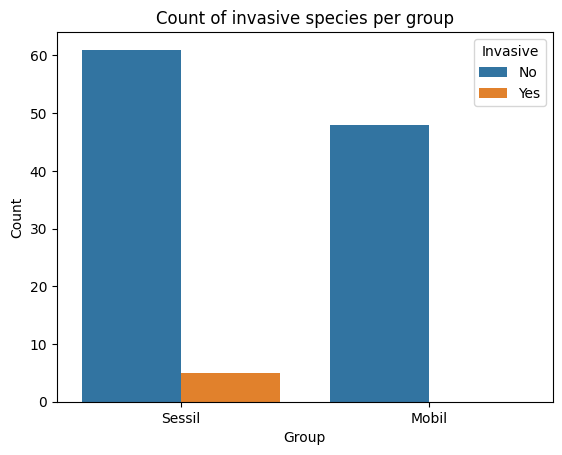

In [ ]:
# Explore the invasive field of the dataframe

sns.countplot(data=df_all_species, x='Group', hue='Invasive')
plt.title('Count of invasive species per group')
plt.xlabel('Group')
plt.ylabel('Count');

print('Invasive species:', list(df_all_species[df_all_species['Invasive']=='Yes']['Specie']), '\n')

It is possible to verify above that all invasive species are sessil, despite still being the minority in this category.

Nevertheless, the following species were identified as **invasive**: *Asparagopsis armata*, *Osmundea pinnatifida*, *Cladophora sp.*, *Codium sp.*, *Colpomenia sinuosa*.

Moving on to exploring the existence of endangered species...

According to IUCN [2], the different conservation status categories are:
* Data Defficient (DD) - inadequate information to make an assessment;
* Least Concern (LC) - does not classify for "Red List";
* Near Threatened (NT) - does not classify for "Red List" but is close to, may be in the near future;
* Vulnerable (VU) - facing a high risk of extinction;
* Endangered (EN) - facing a very high risk of extinction;
* Critically Endangered (CR) - facing an extremely high risk of extinction;
* Extinct in The Wild (EW) - known to survive only in cultivation/captivity;
* Extinct (EX) - no doubt that the last individual has died;
* Not Evaluated (NE) - not been evaluated;

The categories in the dataset don't really follow this nomenclature so they were mapped to new categories: **least concern, endangered, potentially endangered and unknown**. Note that those previously referenced as "insufficiently known" were mapped to "potentially endangered" as a suggestion on the challenge brief. The consideration of the status being global or only in Portugal was also disregarded.

Original conservation status: ['no conservation status for this taxon' 'least concern (LC)'
 'commercially threatened (CT)*' 'insufficiently known (I)' '-'
 'insufficiently known (I)*']
Processed conservation status: ['unknown' 'least concern' 'endangered' 'potentially endangered'] 

List of endangered / higher risk of extinction species: ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus'] 

Extended list of endangered / higher risk of extinction species: ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus', 'Lipophrys pholis ', 'Gobius sp.'] 



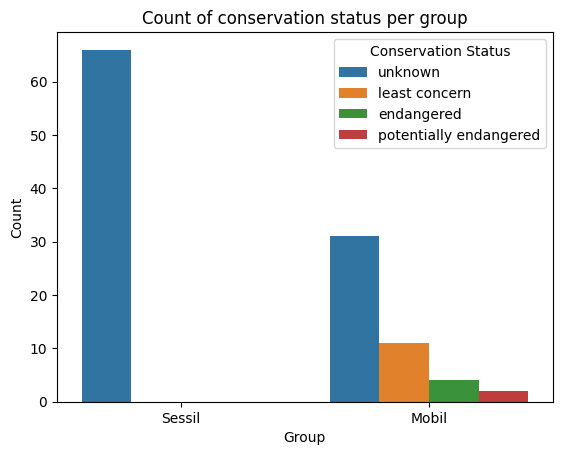

In [ ]:
# Explore the conservation field of the dataframe

print('Original conservation status:', df_all_species['Conservation Status (IUCN)'].unique())

conservation_status_map = {
    'least concern (LC)': 'least concern',
    'commercially threatened (CT)*': 'endangered',
    'no conservation status for this taxon': 'unknown',
    '-': 'unknown',
    'insufficiently known (I)': 'potentially endangered',
    'insufficiently known (I)*': 'potentially endangered'
}
df_all_species['Conservation Status (IUCN)'] = df_all_species['Conservation Status (IUCN)'].map(conservation_status_map)
df_all_species = df_all_species.rename(columns={'Conservation Status (IUCN)': 'Conservation Status'})

print('Processed conservation status:', df_all_species['Conservation Status'].unique(), '\n')

endangered_species = list(df_all_species[df_all_species['Conservation Status']=='endangered']['Specie'])
print('List of endangered / higher risk of extinction species:', endangered_species, '\n')

endangered_species.extend(list(df_all_species[df_all_species['Conservation Status']=='potentially endangered']['Specie']))
print('Extended list of endangered / higher risk of extinction species:', endangered_species, '\n') # POR TEXTO A CORES

sns.countplot(data=df_all_species, x='Group', hue='Conservation Status')
plt.title('Count of conservation status per group')
plt.xlabel('Group')
plt.ylabel('Count');

It is possible to verify above that only mobil species have a known conservation status.

Nevertheless, the following species were identified as **endangered (or potentially endangered)**: *Diplodus sp.*, *Diplodus sargus*, *Diplodus vulgaris*, *Diplodus cervinus*, *Lipophrys pholis*, *Gobius sp.*

In [ ]:
# Save species dataframe for further use

species_data_path = os.path.join(data_dir, 'species.csv')
df_all_species.to_csv(species_data_path, index=False)

Now looking at the temporal data for the previously identified endangered mobil species, some issues in the data were found which required a development of a preprocessing step. The link for these data problems can be found in the visualizations section below.

In [ ]:
# Read sheet with temporal information on mobil species keeping only essential information:
# time data, conditions data, number of individuals from high risk species, overall species abundance
df_mobil = pd.read_excel(data_path,
                         sheet_name=' Mobil (nº individuals)',
                         usecols=['Date', 'Hour', 'Tide', 'Weather Condition',
                                  'Water temperature (ºC)', 'Zone',
                                  'Supratidal/Middle Intertidal', 'Substrate',
                                  'Diplodus sp.', 'Diplodus sargus',
                                  'Diplodus vulgaris', 'Diplodus cervinus',
                                  'Lipophrys pholis (juvenil/recruta)', 'Gobius sp.',
                                  'Abundance (ind/m2)'])
df_mobil = df_mobil.rename(columns={'Lipophrys pholis (juvenil/recruta)': 'Lipophrys pholis'})
print('Initial data types: \n', df_mobil.dtypes)

Initial data types: 
 Date                             object
Hour                             object
Tide                             object
Weather Condition                object
Water temperature (ºC)           object
Zone                             object
Supratidal/Middle Intertidal     object
Substrate                        object
Diplodus sp.                    float64
Diplodus sargus                 float64
Lipophrys pholis                float64
Diplodus vulgaris               float64
Gobius sp.                      float64
Diplodus cervinus               float64
Abundance (ind/m2)              float64
dtype: object


In [ ]:
# Pre-process dataframe due to data inconsistencies found
df_mobil = preprocess_dataframe(df_mobil)
print('Post-processed data types: \n', df_mobil.dtypes)

# Display first five rows
df_mobil.head()

Post-processed data types: 
 Datetime                        datetime64[ns]
Tide                                   float64
Weather Condition                       object
Water temperature (ºC)                 float64
Zone                                    object
Supratidal/Middle Intertidal            object
Diplodus sp.                           float64
Diplodus sargus                        float64
Lipophrys pholis                       float64
Diplodus vulgaris                      float64
Gobius sp.                             float64
Diplodus cervinus                      float64
Abundance (ind/m2)                     float64
puddle                                   int64
rock                                     int64
sand                                     int64
pebble                                   int64
canal                                    int64
sea                                      int64
dtype: object


,Datetime,Tide,Weather Condition,Water temperature (ºC),Zone,Supratidal/Middle Intertidal,Diplodus sp.,Diplodus sargus,Lipophrys pholis,Diplodus vulgaris,Gobius sp.,Diplodus cervinus,Abundance (ind/m2),puddle,rock,sand,pebble,canal,sea
2,2011-11-28 10:10:00,0.6,Clear sky,16.0,D,medium,0.0,0.0,0.0,0.0,0.0,0.0,0.20,1,1,0,0,0,0
3,2011-11-28 10:25:00,0.6,Clear sky,16.0,D,medium,0.0,0.0,0.0,0.0,0.0,0.0,0.10,1,1,0,0,0,0
4,2011-11-28 10:40:00,0.6,Clear sky,16.0,D,medium,0.0,0.0,0.0,0.0,0.0,0.0,0.05,1,1,0,0,0,0
7,2011-11-28 11:00:00,0.6,Clear sky,16.0,E,medium,0.0,0.0,0.0,0.0,0.0,0.0,0.10,1,1,0,0,0,0
8,2011-11-28 11:15:00,0.6,Clear sky,16.0,E,medium,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,1,0,0,0,0


It is possible to observe above that after pre-processing the data types were correct: float64 for float columns and object for string columns. Once the data was fixed, we moved on to a graphical analysis of the different variables to have a better perception of them.

From analysing the graphs we can see that most of the observations occur during a clear sky day, have a tide between 0.2m and 1.4m, and a water temperature between 10ºC and 22ºC.

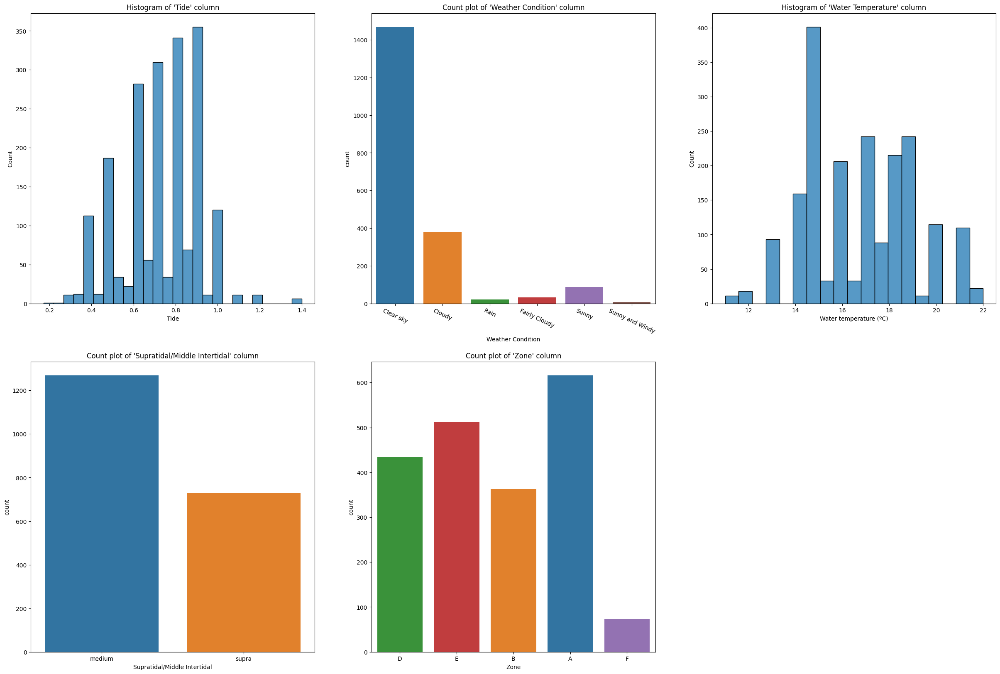

In [ ]:
# View data distribution

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

sns.histplot(data=df_mobil, x='Tide', ax=axes[0, 0])
axes[0, 0].set_title('Histogram of \'Tide\' column')

palette = {'Clear sky': 'C0', 'Cloudy': 'C1', 'Rain': 'C2', 'Fairly Cloudy': 'C3', 'Sunny': 'C4', 'Sunny and Windy': 'C5'}
sns.countplot(data=df_mobil, x='Weather Condition', ax=axes[0, 1], palette=palette)
axes[0, 1].tick_params(axis='x', rotation=-25)
axes[0, 1].set_title('Count plot of \'Weather Condition\' column')

sns.histplot(data=df_mobil, x='Water temperature (ºC)', ax=axes[0, 2])
axes[0, 2].set_title('Histogram of \'Water Temperature\' column')

sns.countplot(data=df_mobil, x='Supratidal/Middle Intertidal', ax=axes[1, 0])
axes[1, 0].set_title('Count plot of \'Supratidal/Middle Intertidal\' column')

palette = {'A': 'C0', 'B': 'C1', 'D': 'C2', 'E': 'C3', 'F': 'C4'}
sns.countplot(data=df_mobil, x='Zone', ax=axes[1, 1], palette=palette)
axes[1, 1].set_title('Count plot of \'Zone\' column')

axes[1, 2].axis('off');

Each observation had a column that described what substrate was the species observed on.
Some of the obversations were annotated in several substrates, so here we can observe a plot with the count of how many times a substrate has appeared and how many times it was absent.

We can observe that the most present substrates were: rock, puddle and sand.
The least present substrate was the sea. It was also harder for the people collecting the data to make observations in the sea/high tide.

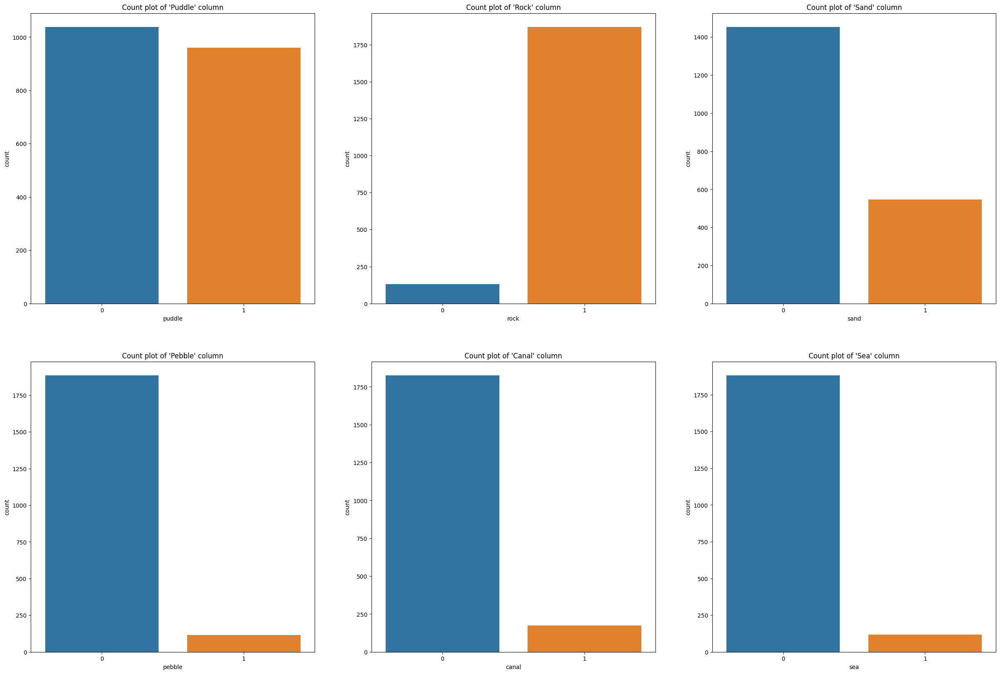

In [ ]:
# View data distribution of different substracts

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

sns.countplot(data=df_mobil, x='puddle', ax=axes[0, 0])
axes[0, 0].set_title('Count plot of \'Puddle\' column')

sns.countplot(data=df_mobil, x='rock', ax=axes[0, 1])
axes[0, 1].set_title('Count plot of \'Rock\' column')

sns.countplot(data=df_mobil, x='sand', ax=axes[0, 2])
axes[0, 2].set_title('Count plot of \'Sand\' column')

sns.countplot(data=df_mobil, x='pebble', ax=axes[1, 0])
axes[1, 0].set_title('Count plot of \'Pebble\' column')

sns.countplot(data=df_mobil, x='canal', ax=axes[1, 1])
axes[1, 1].set_title('Count plot of \'Canal\' column')

sns.countplot(data=df_mobil, x='sea', ax=axes[1, 2])
axes[1, 2].set_title('Count plot of \'Sea\' column');

We verified the uniqueness of datetime measures and discovered that some of the datetime stamps were repeated. These repeated datetime stamps correspond to replicates of the observations as explained by the providers of the dataset.

In [ ]:
# Check uniqueness of datetime measures

df_mobil['Datetime'].value_counts()

2016-10-31 08:00:00    11
2018-04-17 09:00:00    11
2016-12-15 08:40:00    11
2018-02-20 09:00:00    11
2016-12-16 09:40:00    11
                       ..
2012-10-29 11:15:00     1
2012-10-29 10:45:00     1
2012-10-29 10:30:00     1
2012-10-29 10:00:00     1
2013-08-22 10:30:00     1
Name: Datetime, Length: 1285, dtype: int64

The graphs below show the evolution of the abundance of mobil species over time in the different zones analysed. It is possible to verify that from 2016 onwards, all mobile species present a significant decline, a fact which was not properly explained/justified. We can observe that this is coincident with the beggining of the replicates. Initially, it was thought that this was related to a natural disaster, for example, a storm, but from our knowledge this was not the case.

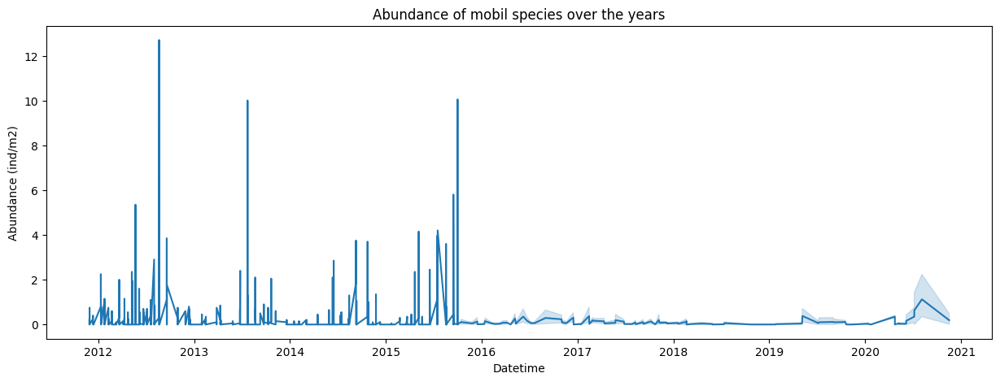

In [ ]:
# Observe mobil species abundance over the years

plt.figure(figsize=(15, 5))
sns.lineplot(x='Datetime', y='Abundance (ind/m2)', data=df_mobil)
plt.title('Abundance of mobil species over the years');

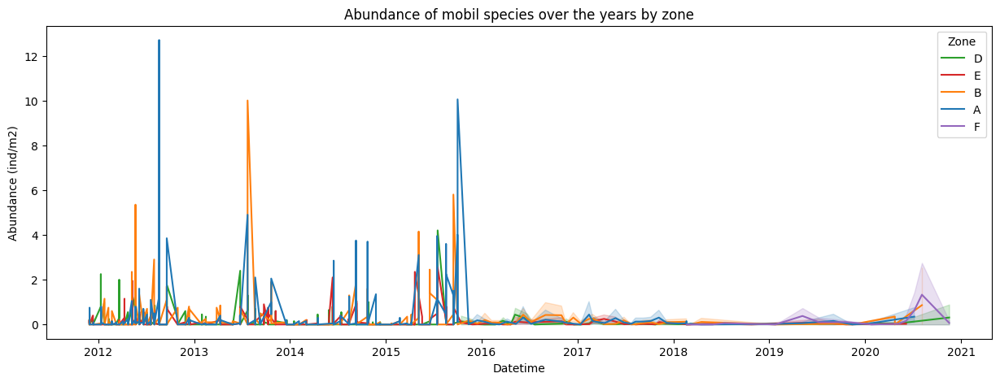

In [ ]:
# Observe mobil species abundance over the years by zone

palette = {'A': 'C0', 'B': 'C1', 'D': 'C2', 'E': 'C3', 'F': 'C4'}
plt.figure(figsize=(15, 5))
sns.lineplot(x='Datetime', y='Abundance (ind/m2)', hue='Zone', data=df_mobil, palette=palette)
plt.title('Abundance of mobil species over the years by zone');

The evolution of the abundance of the mobil **endangered** species is presented below. The species with the most abundance of the group was the *Gobius sp.*. There are peak abundances of some species in the years before 2016.

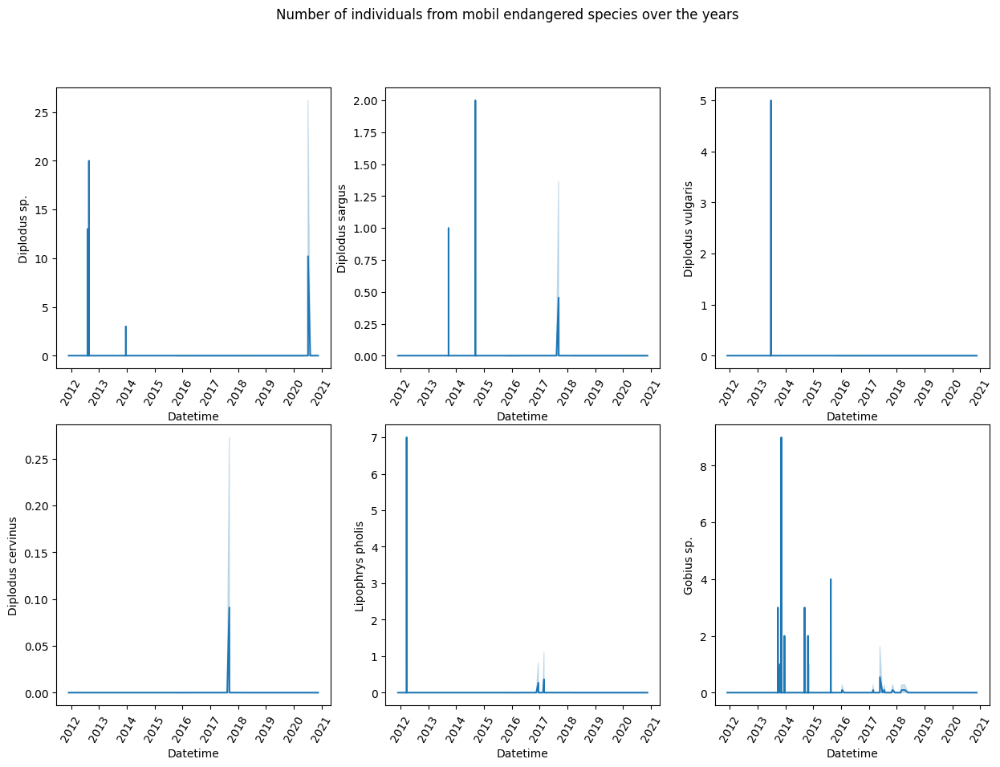

In [ ]:
# Observe endangered mobil species abundance over the years

plot_columns = ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus', 'Lipophrys pholis', 'Gobius sp.']
positions = [[0, 0], [0, 1], [0, 2], [1, 0], [1, 1], [1, 2]]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Number of individuals from mobil endangered species over the years')

for i, column in enumerate(plot_columns):
  pos = positions[i]
  ax = axes[pos[0], pos[1]]
  sns.lineplot(x='Datetime', y=column, data=df_mobil, ax=ax)
  ax.tick_params(axis='x', rotation=60)

In the graph below, it is observed the abundance of the species separated by zone. *Zone* D contains a high peak of abundance for the *Diplodus vulgaris*, *Lipophrys pholis* and the *Gobius sp.* in the years before 2016. After 2016, the zones that have peaks are A, B and F.

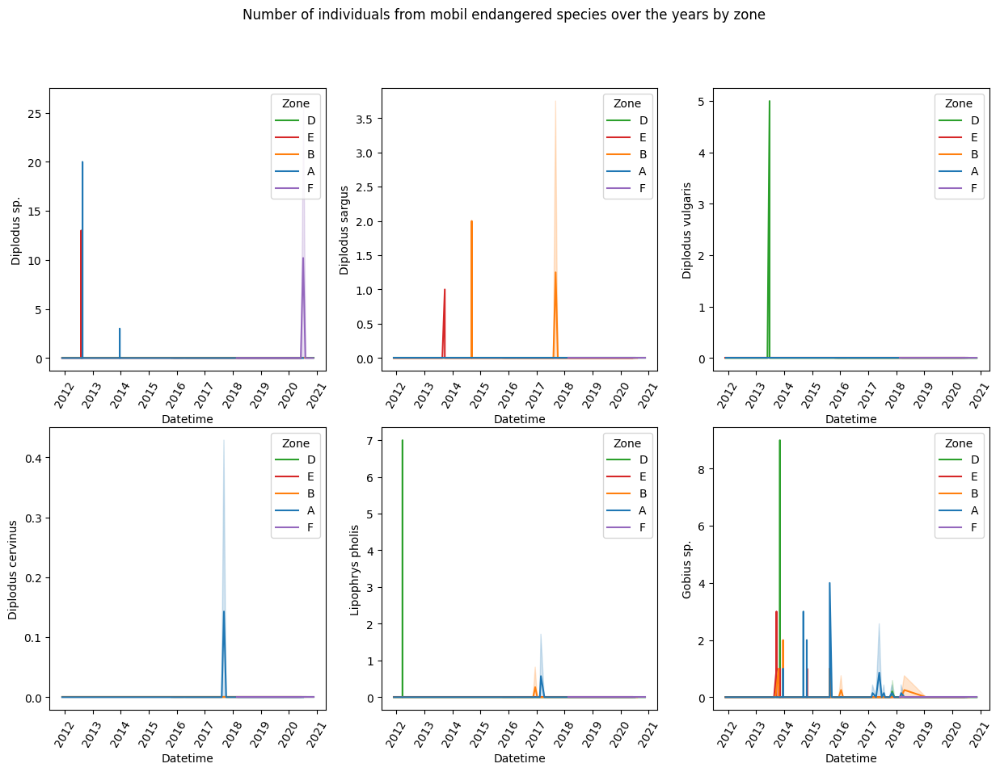

In [ ]:
# Observe endangered mobil species abundance over the years by zone

plot_columns = ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus', 'Lipophrys pholis', 'Gobius sp.']
positions = [[0, 0], [0, 1], [0, 2], [1, 0], [1, 1], [1, 2]]
palette = {'A': 'C0', 'B': 'C1', 'D': 'C2', 'E': 'C3', 'F': 'C4'}

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Number of individuals from mobil endangered species over the years by zone')

for i, column in enumerate(plot_columns):
  pos = positions[i]
  ax = axes[pos[0], pos[1]]
  sns.lineplot(x='Datetime', y=column, hue='Zone', data=df_mobil, ax=ax, palette=palette)
  ax.tick_params(axis='x', rotation=60)

It is clear that the number of individuals appears at very specific points in time, which may imply that these species are not usual in the area.

From all the mobil endangered species, **Gobius sp.** is the species that has more temporal information, although when looking at the abundance separated by zones we can observe that the closest peaks are from different zones.

The inconsistency of abundance across the species and the zones makes the training of a temporal predictive model harder.

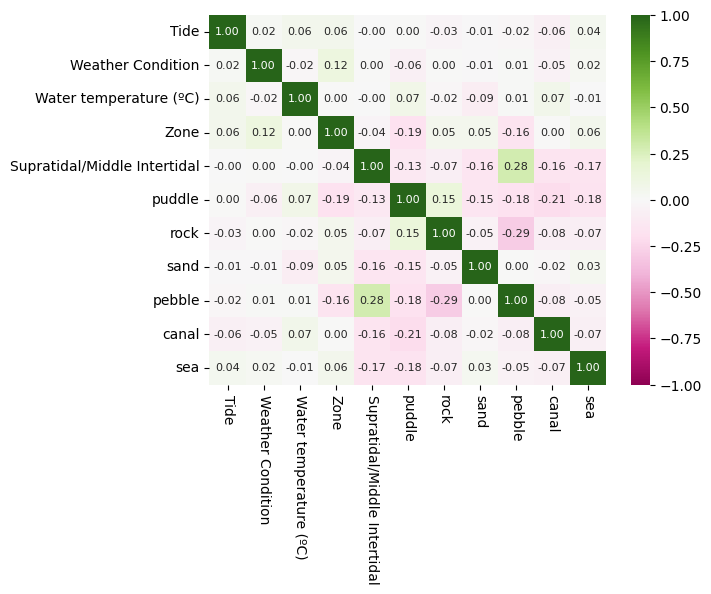

In [ ]:
df_features = df_mobil.drop(columns=['Datetime', 'Diplodus sp.', 'Diplodus sargus',
                                      'Diplodus vulgaris', 'Diplodus cervinus',
                                      'Lipophrys pholis', 'Gobius sp.', 'Abundance (ind/m2)'])

encoding_columns = ['Weather Condition', 'Zone', 'Supratidal/Middle Intertidal']
for column in encoding_columns:
  df_features[column] = df_features[column].astype('category')
  df_features[column] = df_features[column].cat.codes

# Compute the correlation matrix for the features
corr = df_features.corr()

# Plot correlation matrix
plt.plot(fig_size=(16, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='PiYG', annot_kws={"fontsize": 8},  fmt=".2f");
plt.xticks( rotation=-90)
plt.show()

In [ ]:
# Save preprocessed mobil endangered dataframe for further use

mobil_data_path = os.path.join(data_dir, 'mobil_endangered_preprocessed.csv')
df_mobil.to_csv(mobil_data_path, index=False)

Now looking at the temporal data for the invasive sessil species. As with the mobil species data, we start by pre-processing the data due to the data issued identified.

In [ ]:
# Read sheet with temporal information on sessil species keeping only essential information:
# time data, conditions data, % coverage of invasive species, overall % coverage
df_sessil = pd.read_excel(data_path,
                          sheet_name='Sessil (% Coverage)',
                          usecols=['Date', 'Hour', 'Tide', 'Weather Condition',
                                   'Water temperature (ºC)', 'Zone',
                                   'Supratidal/Middle Intertidal', 'Substrate',
                                   'Asparagopsis armata (tufosa)', 'Osmundea pinnatifida',
                                   'Cladophora sp. (limo)', 'Codium sp. (alga verde carnuda)',
                                   'Colpomenia sinuosa (alga bolhas)', 'TOTAL2'])
df_sessil = df_sessil.rename(columns={'Asparagopsis armata (tufosa)': 'Asparagopsis armata',
                                      'Cladophora sp. (limo)': 'Cladophora sp.',
                                      'Codium sp. (alga verde carnuda)': 'Codium sp.',
                                      'Colpomenia sinuosa (alga bolhas)': 'Colpomenia sinuosa',
                                      'TOTAL2': 'Coverage (%)'})
print('Initial data types: \n', df_sessil.dtypes)

Initial data types: 
 Date                            datetime64[ns]
Hour                                    object
Tide                                   float64
Weather Condition                       object
Water temperature (ºC)                  object
Zone                                    object
Supratidal/Middle Intertidal            object
Substrate                               object
Asparagopsis armata                    float64
Osmundea pinnatifida                   float64
Cladophora sp.                         float64
Codium sp.                             float64
Colpomenia sinuosa                     float64
Coverage (%)                            object
dtype: object


In [ ]:
# Pre-process dataframe due to data inconsistencies found
df_sessil = preprocess_dataframe(df_sessil)
print('Post-processed data types: \n', df_sessil.dtypes)

# Display first five rows
df_sessil.head()

Post-processed data types: 
 Datetime                        datetime64[ns]
Tide                                   float64
Weather Condition                       object
Water temperature (ºC)                 float64
Zone                                    object
Supratidal/Middle Intertidal            object
Asparagopsis armata                    float64
Osmundea pinnatifida                   float64
Cladophora sp.                         float64
Codium sp.                             float64
Colpomenia sinuosa                     float64
Coverage (%)                           float64
puddle                                   int64
rock                                     int64
sand                                     int64
pebble                                   int64
canal                                    int64
sea                                      int64
dtype: object


,Datetime,Tide,Weather Condition,Water temperature (ºC),Zone,Supratidal/Middle Intertidal,Asparagopsis armata,Osmundea pinnatifida,Cladophora sp.,Codium sp.,Colpomenia sinuosa,Coverage (%),puddle,rock,sand,pebble,canal,sea
2,2011-11-28 10:10:00,0.6,Clear sky,16.0,D,medium,0.0,0.0,0.0,0.0,0.0,100.00,1,0,0,0,0,0
3,2011-11-28 10:25:00,0.6,Clear sky,16.0,D,medium,0.0,0.0,0.0,0.0,0.0,99.50,0,1,0,0,0,0
4,2011-11-28 10:40:00,0.6,Clear sky,16.0,D,medium,0.0,0.0,0.0,0.0,0.0,66.45,0,1,0,0,0,0
7,2011-11-28 11:00:00,0.6,Clear sky,16.0,E,medium,0.0,0.0,0.0,0.0,0.0,75.10,0,1,0,0,0,0
8,2011-11-28 11:15:00,0.6,Clear sky,16.0,E,medium,0.0,0.0,0.0,0.0,0.0,67.20,0,1,0,0,0,0


For the sessil species, the data distribution remains the same as the data distribution of the mobil species.

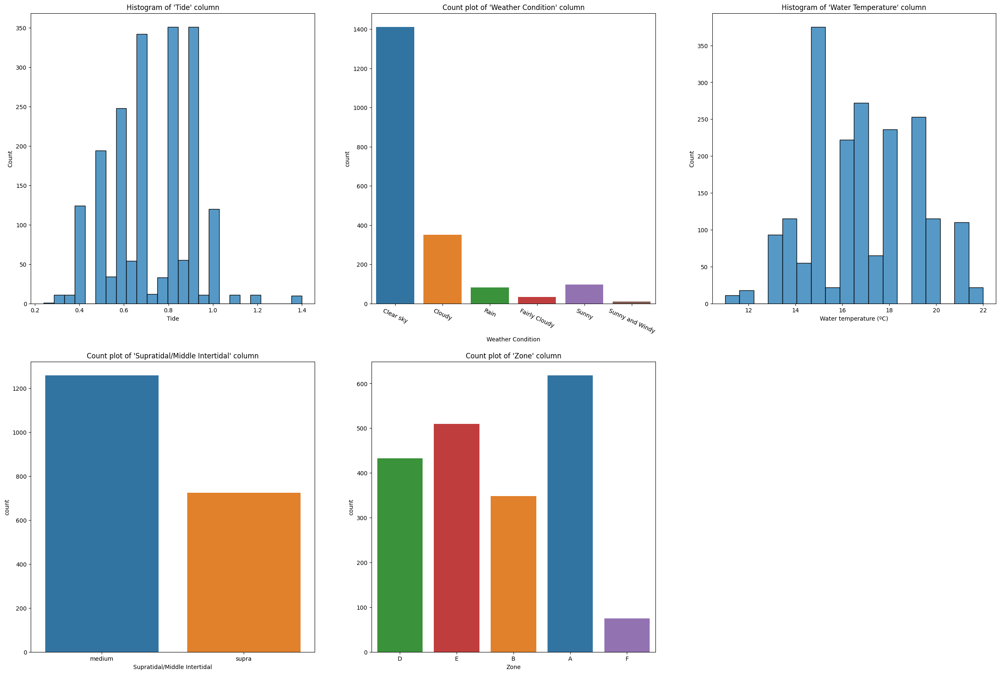

In [ ]:
# View data distribution

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

sns.histplot(data=df_sessil, x='Tide', ax=axes[0, 0])
axes[0, 0].set_title('Histogram of \'Tide\' column')

palette = {'Clear sky': 'C0', 'Cloudy': 'C1', 'Rain': 'C2', 'Fairly Cloudy': 'C3', 'Sunny': 'C4', 'Sunny and Windy': 'C5'}
sns.countplot(data=df_sessil, x='Weather Condition', ax=axes[0, 1], palette=palette)
axes[0, 1].tick_params(axis='x', rotation=-25)
axes[0, 1].set_title('Count plot of \'Weather Condition\' column')

sns.histplot(data=df_sessil, x='Water temperature (ºC)', ax=axes[0, 2])
axes[0, 2].set_title('Histogram of \'Water Temperature\' column')

sns.countplot(data=df_sessil, x='Supratidal/Middle Intertidal', ax=axes[1, 0])
axes[1, 0].set_title('Count plot of \'Supratidal/Middle Intertidal\' column')

palette = {'A': 'C0', 'B': 'C1', 'D': 'C2', 'E': 'C3', 'F': 'C4'}
sns.countplot(data=df_sessil, x='Zone', ax=axes[1, 1], palette=palette)
axes[1, 1].set_title('Count plot of \'Zone\' column')

axes[1, 2].axis('off');

The most observed substrates of the rocky shore were the sessil species were present was similar to the most observed substrate in the mobil species. Although "rock" remained the most common substrate, "sand" was the second most observed, followed by "puddle".

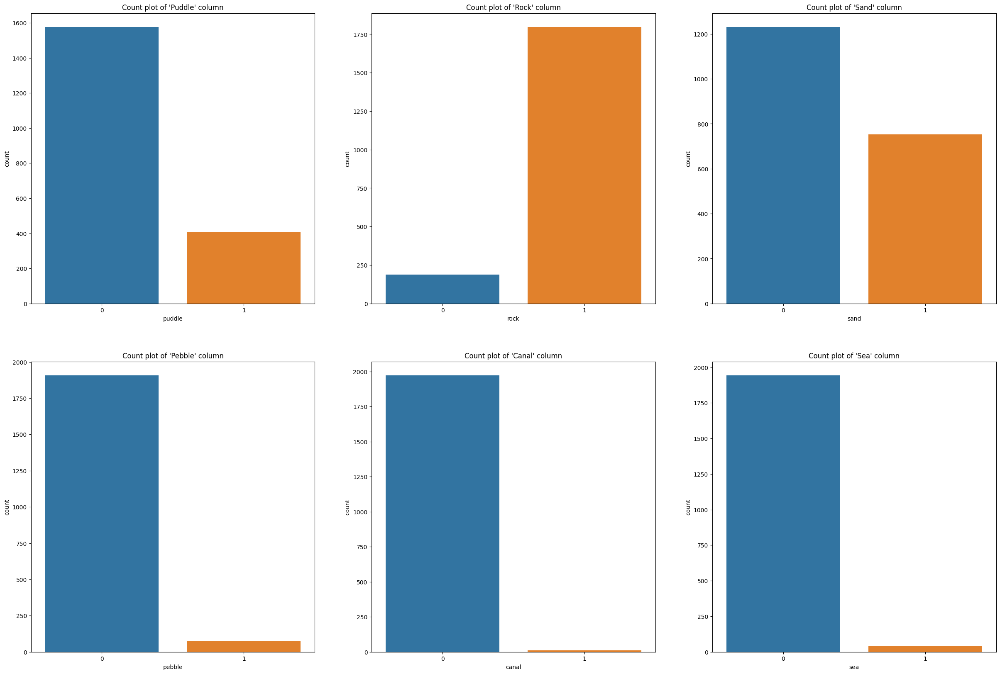

In [ ]:
# View data distribution of different substracts

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

sns.countplot(data=df_sessil, x='puddle', ax=axes[0, 0])
axes[0, 0].set_title('Count plot of \'Puddle\' column')

sns.countplot(data=df_sessil, x='rock', ax=axes[0, 1])
axes[0, 1].set_title('Count plot of \'Rock\' column')

sns.countplot(data=df_sessil, x='sand', ax=axes[0, 2])
axes[0, 2].set_title('Count plot of \'Sand\' column')

sns.countplot(data=df_sessil, x='pebble', ax=axes[1, 0])
axes[1, 0].set_title('Count plot of \'Pebble\' column')

sns.countplot(data=df_sessil, x='canal', ax=axes[1, 1])
axes[1, 1].set_title('Count plot of \'Canal\' column')

sns.countplot(data=df_sessil, x='sea', ax=axes[1, 2])
axes[1, 2].set_title('Count plot of \'Sea\' column');

In [ ]:
# Check uniqueness of datetime measures

df_sessil['Datetime'].value_counts()

2016-04-07 09:00:00    11
2017-10-06 08:30:00    11
2018-04-17 09:00:00    11
2018-03-06 09:30:00    11
2017-01-11 08:40:00    11
                       ..
2012-10-29 09:30:00     1
2012-10-29 09:15:00     1
2012-10-29 09:00:00     1
2012-10-29 08:45:00     1
2013-08-21 10:45:00     1
Name: Datetime, Length: 1263, dtype: int64

The coverage of all of the sessil species can be observed below and it varies significantly during the year. As we saw a decrease of abundance in the mobil species from 2016 onwards, we also saw a decrease in the amplitude of coverage of the sessil species along the year. The amplitude decreased but the standard deviation of the coverage increased significantly.

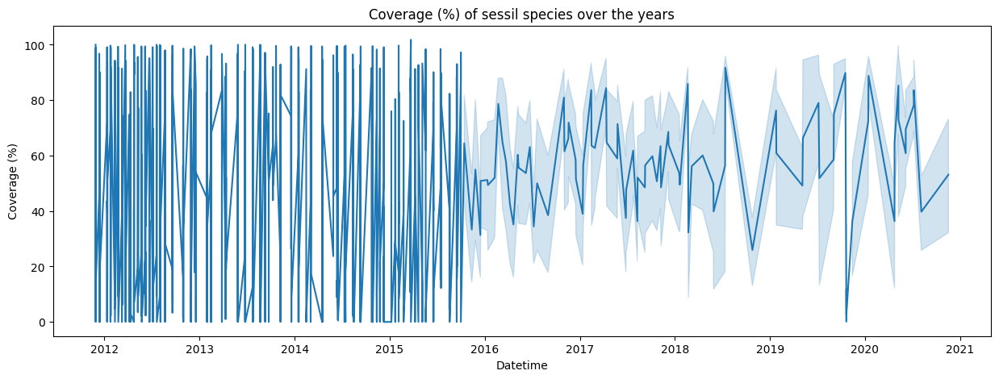

In [ ]:
# Observe sessil species coverage over the years

plt.figure(figsize=(15, 5))
sns.lineplot(x='Datetime', y='Coverage (%)', data=df_sessil)
plt.title('Coverage (%) of sessil species over the years');

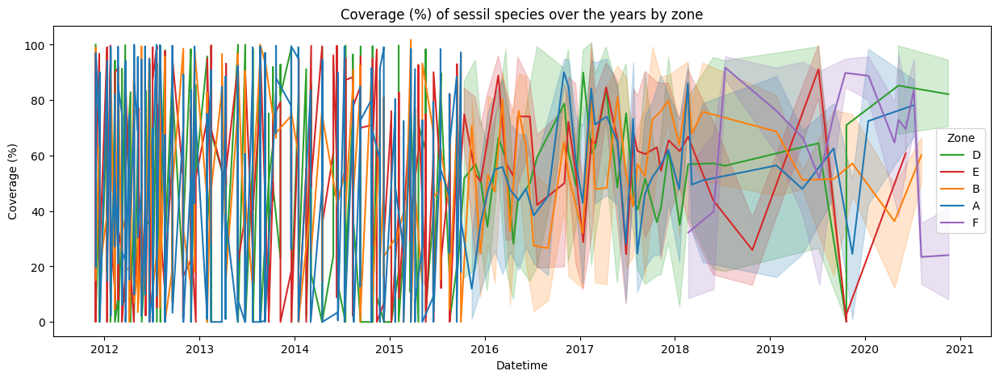

In [ ]:
# Observe sessil species coverage over the years by zone

palette = {'A': 'C0', 'B': 'C1', 'D': 'C2', 'E': 'C3', 'F': 'C4'}
plt.figure(figsize=(15, 5))
sns.lineplot(x='Datetime', y='Coverage (%)', hue='Zone', data=df_sessil, palette=palette)
plt.title('Coverage (%) of sessil species over the years by zone');

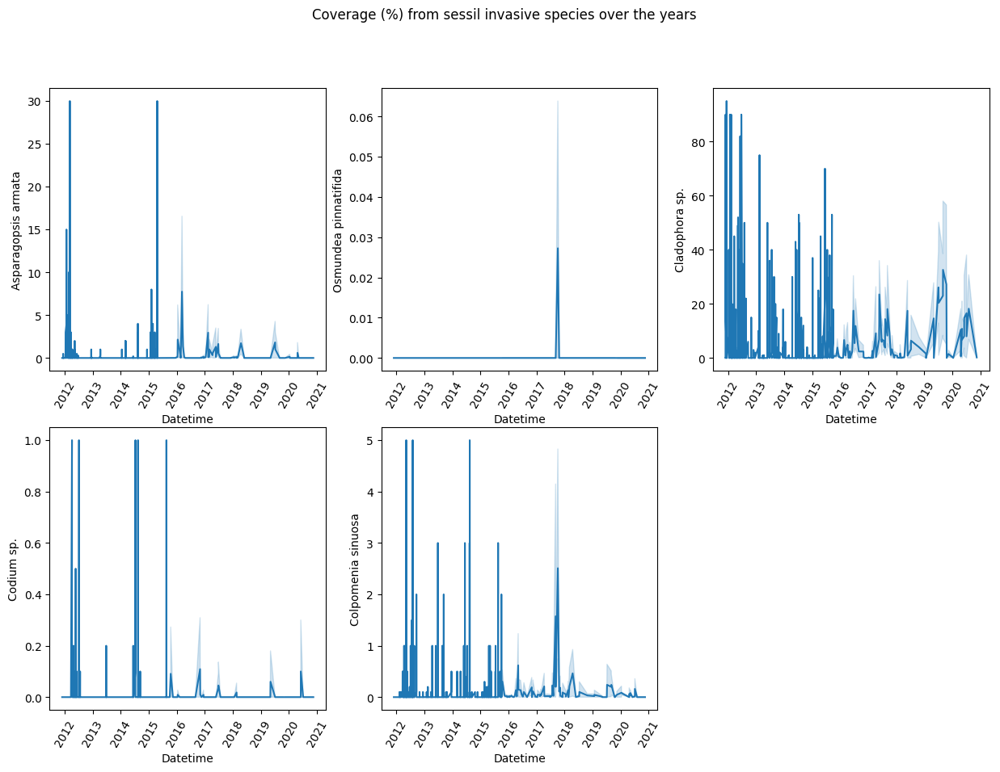

In [ ]:
# Observe sessil invasive species coverage over the years

plot_columns = ['Asparagopsis armata', 'Osmundea pinnatifida', 'Cladophora sp.', 'Codium sp.', 'Colpomenia sinuosa']
positions = [[0, 0], [0, 1], [0, 2], [1, 0], [1, 1]]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Coverage (%) from sessil invasive species over the years')
axes[1, 2].axis('off')

for i, column in enumerate(plot_columns):
  pos = positions[i]
  ax = axes[pos[0], pos[1]]
  sns.lineplot(x='Datetime', y=column, data=df_sessil, ax=ax)
  ax.tick_params(axis='x', rotation=60)

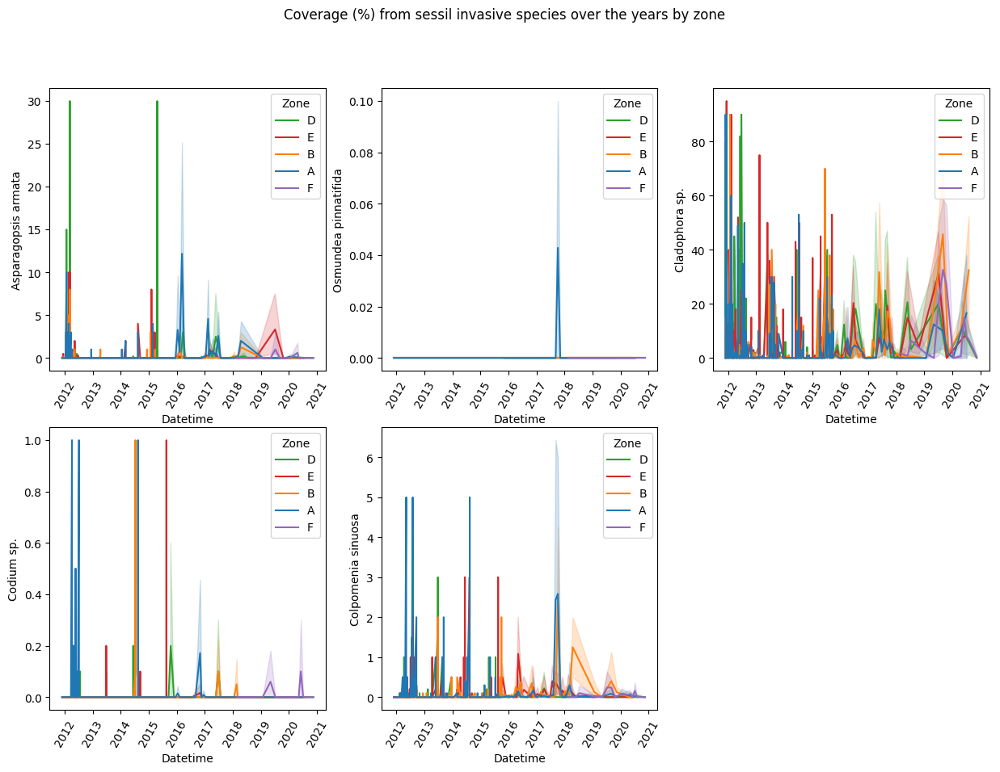

In [ ]:
# Observe sessil invasive species coverage over the years by zone

plot_columns = ['Asparagopsis armata', 'Osmundea pinnatifida', 'Cladophora sp.', 'Codium sp.', 'Colpomenia sinuosa']
positions = [[0, 0], [0, 1], [0, 2], [1, 0], [1, 1]]
palette = {'A': 'C0', 'B': 'C1', 'D': 'C2', 'E': 'C3', 'F': 'C4'}

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Coverage (%) from sessil invasive species over the years by zone')
axes[1, 2].axis('off')

for i, column in enumerate(plot_columns):
  pos = positions[i]
  ax = axes[pos[0], pos[1]]
  sns.lineplot(x='Datetime', y=column, hue='Zone', data=df_sessil, ax=ax, palette=palette)
  ax.tick_params(axis='x', rotation=60)

Analysing the sessil species individually, we can observe that most of the species have some data continuity, in contrast to the mobil species data. The species *Cladophora sp.* and *Colpomenia sinuosa* have the most data continuity according to the graphs above. Based on this aspect of the data continuity, we chose the *Cladophora sp.* as a case of study and tried to create the first predictive model for this species.


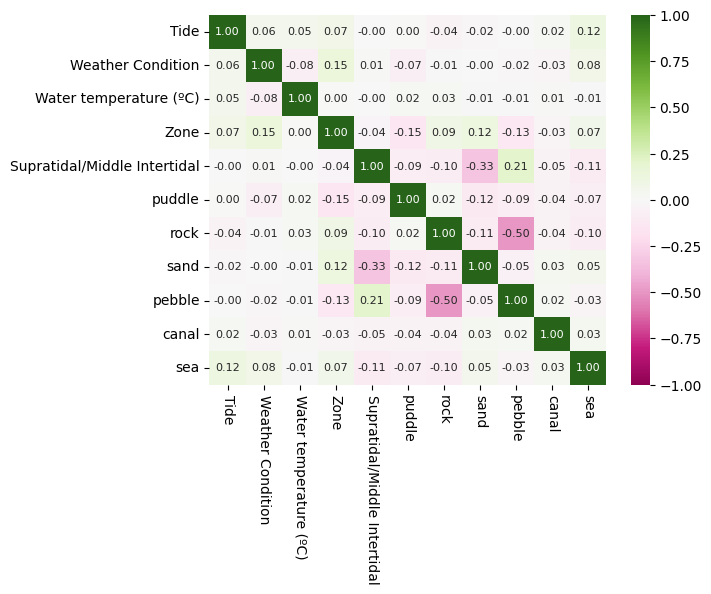

In [ ]:
df_features = df_sessil.drop(columns=['Datetime', 'Asparagopsis armata',
                                      'Osmundea pinnatifida', 'Cladophora sp.',
                                      'Codium sp.', 'Colpomenia sinuosa', 'Coverage (%)'])

encoding_columns = ['Weather Condition', 'Zone', 'Supratidal/Middle Intertidal']
for column in encoding_columns:
  df_features[column] = df_features[column].astype('category')
  df_features[column] = df_features[column].cat.codes

# Compute the correlation matrix
corr = df_features.corr()

# Plot correlation matrix
plt.plot(fig_size=(16, 5))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='PiYG', annot_kws={"fontsize": 8},  fmt=".2f");
plt.xticks(rotation=-90);

The correlation matrix between the variables of the data is shown above.
Some of the one hot encoded variables of the substrate are exclusive, for example the substract is usually or pebble or rock, not both, therefore, they have a negative correlation. While the pebble substrate is correlated with the supratidal/middle tidal zone because pebbles usually are present in this area closer to the shore.
There is a slight correlation with the tide level and the sea substrate as well, because a high tide might increase the probably of more species being identified with this substrate. Another weak correlation is present between the weather condition and the zone were the sample was taken.

In [ ]:
# Save preprocessed sessil dataframe for further use

sessil_data_path = os.path.join(data_dir, 'sessil_invasive_preprocessed.csv')
df_sessil.to_csv(sessil_data_path, index=False)

### Feature engineering

As part of the feature engineering step, a final dataframe was created for each identified invasive/endangered species, for each zone, containing all of the features seen in the EDA function, together with two others:

1. Knowing that the **seasons (e.g. spring, winter)** highly influence the marine life, we believe it is important to add this column to the dataframe in order to measure this influence. Therefore, we developed a function to retrieve the season information from the dates contained in the dataframe, adding that feature;
2. Another factor that is known to have an influence on the tides is the Moon's position, due to its gravitational pull on the Earth's water [3]. Therefore, considering that it influences the tide, we put the hypothesis of it also influencing marine life so we developed a function to retrieve the **moon phase** information from the dates contained in the dataframe, adding yet another feature.

The replicated datetime stamps identified in the EDA section were fused together by doing the mean (tide and water temperature) or the mode (e.g. substrate) of the features.

Observing a trend in the data is more interesting that getting the exact measurement values, therefore, a smoothing was applied using a weighted moving average.

Finally, by knowing that the temporal information is of high importance - i.e. the abundance of a species on a specific day is very dependent on the abundance observed in the day before, there was the need to create a new column with this information in order for the data to be used as input in classical machine learning models.

In [ ]:
data_dir = '/content/drive/My Drive/WDL/Semi-Finals/Data'

sessil_data_path = os.path.join(data_dir, 'sessil_invasive_preprocessed.csv')
mobil_data_path = os.path.join(data_dir, 'mobil_endangered_preprocessed.csv')

sessil_data_dir = os.path.join(data_dir, 'sessil')
mobil_data_dir = os.path.join(data_dir, 'mobil')

In [ ]:
# Load preprocessed dataset table - sessil invasive and mobil endangered species
df_sessil = pd.read_csv(sessil_data_path)
df_mobil = pd.read_csv(mobil_data_path)

# Set name of variables
sessil_labels = ['Asparagopsis armata', 'Osmundea pinnatifida', 'Cladophora sp.', 'Codium sp.', 'Colpomenia sinuosa', 'Coverage (%)']
mobil_labels = ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus', 'Lipophrys pholis', 'Gobius sp.', 'Abundance (ind/m2)']

# Set zones
zones = ['A', 'B', 'D', 'E', 'F']

# Loop through each sessil label
for label in sessil_labels:
  # Loop through each zone
  for zone in zones:
    # Get dataframe after feature engineering
    df = feature_engineering(df_sessil, label, zone)
    # Save dataframe
    save_name = label.replace(' ', '_').replace('.', '').replace(' (%)', '') + '_' + zone + '.csv'
    df.to_csv(os.path.join(sessil_data_dir, save_name), index=False)
    print(save_name, 'saved!')

# Loop through each mobil label
for label in mobil_labels:
  # Loop through each zone
  for zone in zones:
    # Get dataframe after feature engineering
    df = feature_engineering(df_mobil, label, zone)
    # Save dataframe
    save_name = label.replace(' ', '_').replace('.', '').replace('(ind/m2)', '(ind_per_m2)') + '_' + zone + '.csv'
    df.to_csv(os.path.join(mobil_data_dir, save_name), index=False)
    print(save_name, 'saved!')

In [ ]:
print('Content of saved dataframes - example for Abundance (ind/m2): \n', df.keys().to_list())

Content of saved dataframes - example for Abundance (ind/m2): 
 ['Datetime', 'Tide', 'Weather Condition', 'Water temperature (ºC)', 'Supratidal/Middle Intertidal', 'puddle', 'rock', 'sand', 'pebble', 'canal', 'sea', 'Abundance (ind/m2)', 'Season', 'Moon phase', 'Abundance (ind/m2) smooth', 'Previous Abundance (ind/m2)', 'Previous Abundance (ind/m2) smooth', 'Time difference (hours)', 'Weather Condition encoded', 'Season encoded', 'Moon phase encoded', 'Supratidal/Middle Intertidal encoded']


### Models

In [ ]:
data_dir = '/content/drive/My Drive/WDL/Semi-Finals/Data'
sessil_data_dir = os.path.join(data_dir, 'sessil')
mobil_data_dir = os.path.join(data_dir, 'mobil')

models_dir = '/content/drive/My Drive/WDL/Semi-Finals/Models'

#### Machine Learning approach:

*   Random Forest Regression
*   Gradient Boosting Regression
*   XGB Regression

##### Starting with Cladophora sp. on zone B (train-test) and zone A (test only):



In [ ]:
# Load data to model
data = pd.read_csv(os.path.join(sessil_data_dir, 'Cladophora_sp_B.csv'))

In [ ]:
# Train-test split without shuffling (to respect temporal information)
data_filt = data[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', 'Previous Cladophora sp. smooth', 'Time difference (hours)',
                  'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble', 'canal', 'sea', 'Cladophora sp. smooth']]

train_data, test_data = train_test_split(data_filt, test_size=0.2, shuffle=False)

X_train = train_data.iloc[:,:-1]
y_train = train_data.iloc[:,-1]

X_test = test_data.iloc[:,:-1]
y_test = test_data.iloc[:, -1]

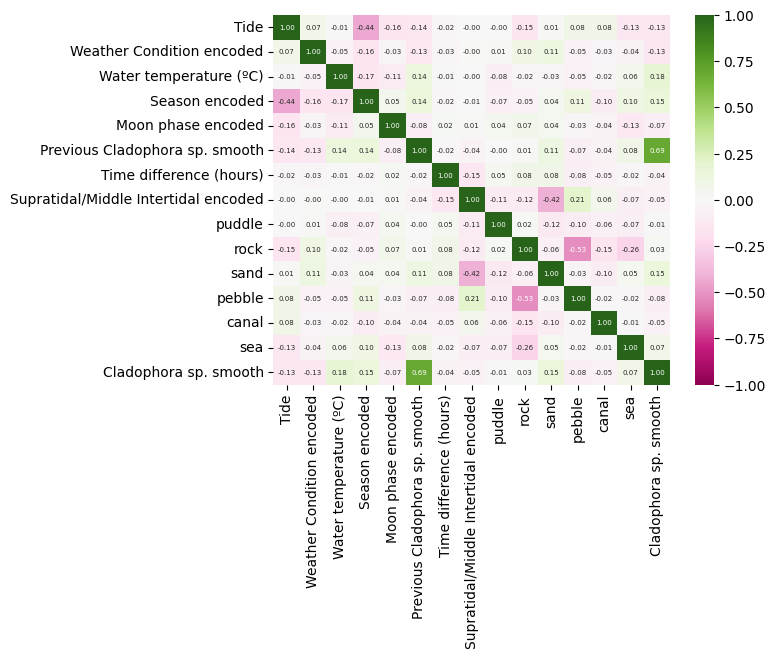

In [ ]:
# Plot the correlation matrix

corr = train_data.corr()
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='PiYG', annot_kws={"fontsize": 5},  fmt=".2f");

In the correlation matrix displayed above, we added new variables to use as input for the model and we noticed that the season is inversely correlated with the tide, which makes sense because in the winter months the tide is higher and vice-versa. The highest correlation (0.69) corresponds to the previous value of coverage of the species with the present value of coverage of the species, in other words, the coverage of the past is likely to affect the coverage in the species of the future.

In [ ]:
# Train-val split to be used for hyperparameter tuning
len_train_data = len(y_train)

# -1 indices will be kept in train
len_train_hyper = int(0.8*len_train_data)
train_indices = np.full((len_train_hyper,), -1, dtype=int)

# 0 indices will be kept in validation
len_valid_hyper = len_train_data-len_train_hyper
valid_indices = np.full((len_valid_hyper,), 0, dtype=int)
valid_fold = np.append(train_indices, valid_indices)

# Create predefined split
predefined_split = PredefinedSplit(valid_fold)

# Run hyperparameter tuning
best_params = hyperparameter_tuning_ml(X_train, y_train, predefined_split)


Model: RandomForestRegressor
Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}
Best MSE score: 38.01

Model: GradientBoostingRegressor
Best parameters: {'learning_rate': 0.01, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}
Best MSE score: 39.09

Model: XGBRegressor
Best parameters: {'learning_rate': 0.1, 'max_depth': None, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
Best MSE score: 35.68


In [ ]:
# Train each model with its best hyperparameters

print('RandomForestRegressor')
rf_model = train_rf(**best_params['RandomForestRegressor'], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
model_path = os.path.join(models_dir, 'rf_Cladophora_sp_B.pkl')
joblib.dump(rf_model, model_path);

print('\nXGBRegressor')
xgb_model = train_xgb(**best_params['XGBRegressor'], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
model_path = os.path.join(models_dir, 'xgb_Cladophora_sp_B.pkl')
joblib.dump(xgb_model, model_path);

print('\nGradientBoostingRegressor')
gbr_model = train_gbr(**best_params['GradientBoostingRegressor'], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
model_path = os.path.join(models_dir, 'gbr_Cladophora_sp_B.pkl')
joblib.dump(gbr_model, model_path);

Random ForestRegressor
Training set R^2 score: 0.795042085192113
Test set R^2 score: 0.37333540039001956

XGBRegressor
Training set R^2 score: 0.9970620787182437
Test set R^2 score: 0.20392037528019458

GradientBoostingRegressor
Training set R^2 score: 0.9997354204233856
Test set R^2 score: -0.45065849033153493


The XGBRegressor and Gradient Boosting Regressor have a higher training set R^2 score than the Random Forest Regressor but have a lower R^2 score in the test set, suggesting the Random Forest Regressor is the one that least overfits. The other models are more likely to overfit compared to the Random Forest Regressor due to several reasons:

1.   Gradient boosting algorithms are more complex, with more hyperparameters to tune and options for model structure, making them prone to capturing intricate relationships in the data but increasing the risk of overfitting.
2.    Their sequential nature, where each new tree is trained to correct errors from previous ones, can lead to overfitting if not controlled properly, as the model becomes too specialized in capturing the training data.
3.    These algorithms emphasize difficult-to-predict instances during training, further increasing the risk of overfitting. On the other hand, the Random Forest Regressor mitigates overfitting risks through its ensemble approach, building independent trees on random subsets of data and features. This randomness reduces the correlation between trees, prevents overreliance on specific features, and improves generalization.

Overall, while gradient boosting algorithms offer high predictive performance, careful regularization and hyperparameter tuning are necessary to mitigate overfitting risks, whereas Random Forest Regressor inherently provides some protection against overfitting.

Feature ranking:
1. feature 5 (0.695245)
2. feature 3 (0.097360)
3. feature 2 (0.050387)
4. feature 6 (0.039539)
5. feature 10 (0.035133)
6. feature 0 (0.025775)
7. feature 4 (0.023157)
8. feature 7 (0.021821)
9. feature 8 (0.005821)
10. feature 9 (0.004937)
11. feature 13 (0.000464)
12. feature 1 (0.000339)
13. feature 12 (0.000016)
14. feature 11 (0.000005)


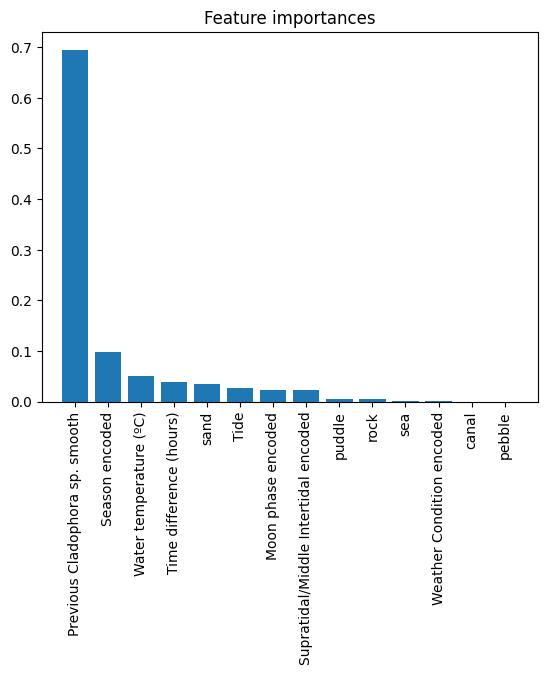

In [ ]:
# Generate feature importances plot
plot_feature_importances(rf_model, X_train)

The feature importance goes in concordance with what was seen in the correlation matrix, showing that the model gives more importance to the previous value of coverage of the species, followed by the season of the year. Different species are prone to proliferate better in certain seasons and in a specific water temperature

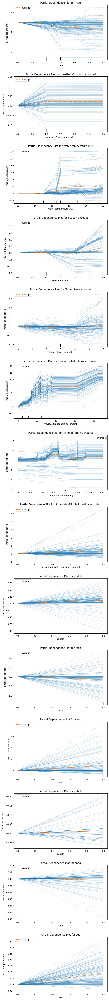

In [ ]:
features = ['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', 'Previous Cladophora sp. smooth', 'Time difference (hours)',
            'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble', 'canal', 'sea']

# Generate partial dependence displays
plot_partial_dependence_displays(X_train, y_train, rf_model, features)

Above this commentary are plotted the partial dependence plots (PDPs), they represent how does the prediction using the trained model would change if the target feature would change. This interpretation method assumes that all of the features are independent, which is not totally true in this case. For example, the season might be related with the weather condition, the water temperature and the tide.

From the PDPs of the water temperature we can observe that the increase in the value of the water temperature increases the prediction value. In other words, if all of the variables in the prediction are unchanged except for the water temperature, we notice that values higher than 16 result in higher coverage of the species.

Climate change has a big impact in ocean temperature. As such, if it can be predicted a negative impact of the increase of water temperature on the proliferation of competition of certain species, we can sensitize people even further.

Looking at the PDP of the previous value of the coverage of the species, it is seen that an increase in the value of the previous coverage means an increase in the value of the predicted coverage.

And finally by observing the PDPs of the substrates we can conclude that this species grows more favorably in the sand and pebbles instead of rock, for example.

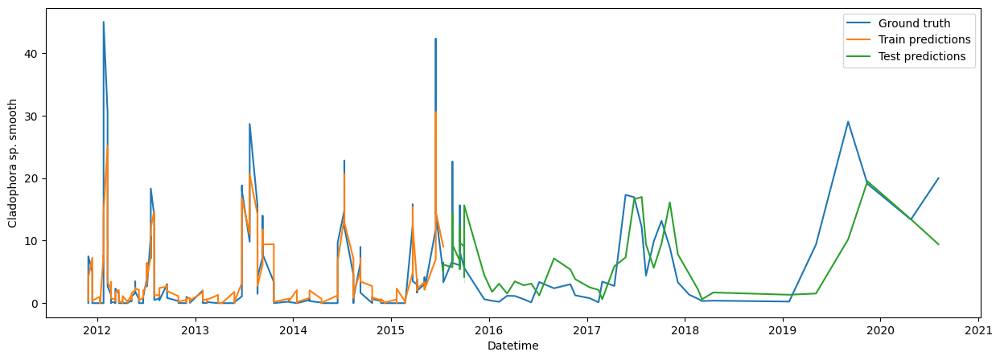

In [ ]:
# Plot predictions vs ground-truth over time

plot_train_test_predictions(rf_model, data, pd.concat([y_train, y_test]), X_train, X_test)

In the graph above, the prediction of the model in the training set underestimates the peaks of coverage of the species but in the test set this difference of the predicted and groundtruth peaks is attenuated.

**Test previously developed model for Cladophora sp. on zone A (supposedly similar to zone B):**

In [ ]:
# Load data to model
data = pd.read_csv(os.path.join(sessil_data_dir, 'Cladophora_sp_A.csv'))

X = data[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', 'Previous Cladophora sp. smooth', 'Time difference (hours)',
          'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble', 'canal', 'sea']]
y = data['Cladophora sp. smooth']

R^2 score: 0.35384065507954676


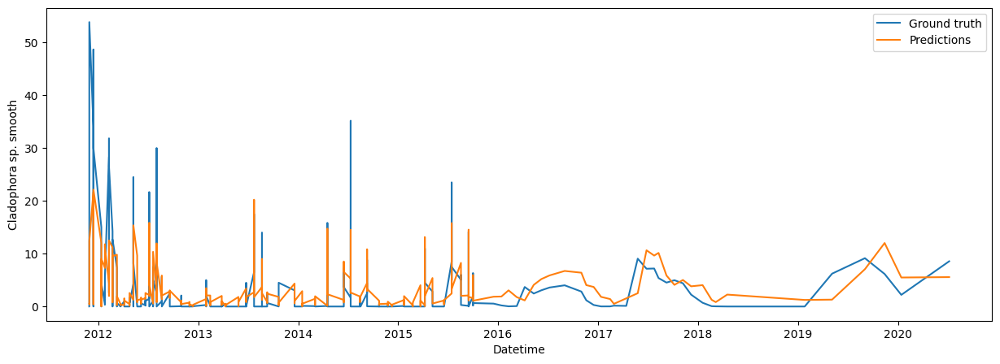

In [ ]:
plot_predictions_unseen_data(rf_model, data, y, X)

The Zone A has similar conditions to Zone B, by using the model trained in Zone B to predict the coverage of the *Cladophora sp.* in Zone A we can see that the prediction R^2 score on this test set is similar.
This leads to believe that a model trained in a specific zone can be used to make predictions in zones with similar environmental conditions.

##### Performing the same analysis but this time for Cladophora sp. on zone D (train-test) and zone E (test only):



In [ ]:
# Load data to model
data = pd.read_csv(os.path.join(sessil_data_dir, 'Cladophora_sp_D.csv'))

In [ ]:
# Train-test split without shuffling (to respect temporal information)
data_filt = data[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', 'Previous Cladophora sp. smooth', 'Time difference (hours)',
                  'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble', 'Cladophora sp. smooth']] # cannal and sea are not present

train_data, test_data = train_test_split(data_filt, test_size=0.2, shuffle=False)

X_train = train_data.iloc[:,:-1]
y_train = train_data.iloc[:,-1]

X_test = test_data.iloc[:,:-1]
y_test = test_data.iloc[:, -1]

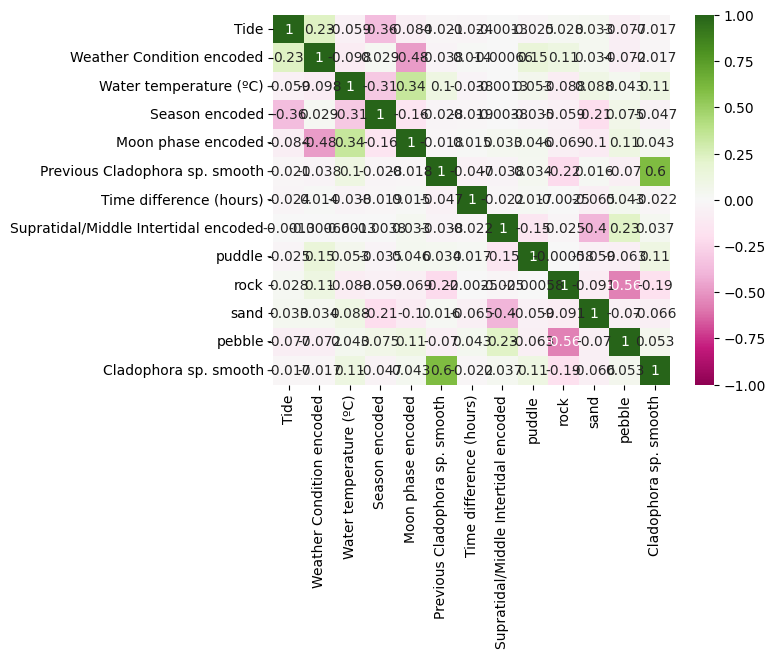

In [ ]:
# Plot the correlation matrix

corr = train_data.corr()
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='PiYG', annot_kws={"fontsize": 5},  fmt=".2f");

The correlation matrix for the data in Zone D is similar to the Zone A data except that it shows a higher absolute correlation between the water temperature and the moon phase, and between the moonphase and the tide level. The moon phase influences the tides and how the cold and warm water the oceans mix, so it makes sense that they are slightly correlated.

In [ ]:
# Train-val split to be used for hyperparameter tuning
len_train_data = len(y_train)

# -1 indices will be kept in train
len_train_hyper = int(0.8*len_train_data)
train_indices = np.full((len_train_hyper,), -1, dtype=int)

# 0 indices will be kept in validation
len_valid_hyper = len_train_data-len_train_hyper
valid_indices = np.full((len_valid_hyper,), 0, dtype=int)
valid_fold = np.append(train_indices, valid_indices)

# Create predefined split
predefined_split = PredefinedSplit(valid_fold)

# Run hyperparameter tuning
best_params = hyperparameter_tuning_ml(X_train, y_train, predefined_split)


Model: RandomForestRegressor
Best parameters: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 500}
Best MSE score: 18.03

Model: GradientBoostingRegressor
Best parameters: {'learning_rate': 0.01, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Best MSE score: 34.48

Model: XGBRegressor
Best parameters: {'learning_rate': 0.01, 'max_depth': 10, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.5}
Best MSE score: 12.04


In [ ]:
# Train each model with its best hyperparameters

print('Random ForestRegressor')
rf_model = train_rf(**best_params['RandomForestRegressor'], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
model_path = os.path.join(models_dir, 'rf_Cladophora_sp_B.pkl')
joblib.dump(rf_model, model_path);

print('\nXGBRegressor')
xgb_model = train_xgb(**best_params['XGBRegressor'], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
model_path = os.path.join(models_dir, 'xgb_Cladophora_sp_B.pkl')
joblib.dump(xgb_model, model_path);

print('\nGradientBoostingRegressor')
gbr_model = train_gbr(**best_params['GradientBoostingRegressor'], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
model_path = os.path.join(models_dir, 'gbr_Cladophora_sp_B.pkl')
joblib.dump(gbr_model, model_path);

Random ForestRegressor
Training set R^2 score: 0.6294800325411432
Test set R^2 score: 0.3038961798935036

XGBRegressor
Training set R^2 score: 0.48577672597427
Test set R^2 score: 0.05924218728494679

GradientBoostingRegressor
Training set R^2 score: 0.6190705223607424
Test set R^2 score: 0.30114986934259214


Once again, the RFR is the model that performs the best in the test set, although this time the GBR has a very similar performance and does not seem to overfit.

Feature ranking:
1. feature 5 (0.700996)
2. feature 2 (0.058259)
3. feature 0 (0.045818)
4. feature 4 (0.042524)
5. feature 6 (0.041917)
6. feature 3 (0.025353)
7. feature 7 (0.024875)
8. feature 11 (0.018799)
9. feature 8 (0.016955)
10. feature 9 (0.016507)
11. feature 1 (0.005269)
12. feature 10 (0.002727)


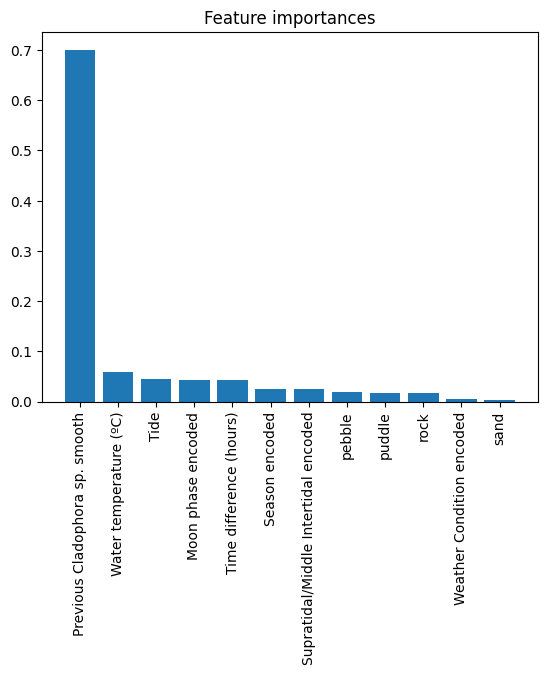

In [ ]:
# Generate feature importances plot
plot_feature_importances(rf_model, X_train)

In the feature analysis for this zone, there is a decrease in the importance of the water temperature, which is later confirmed by the partial dependence plots. And there is an increase in the importance of the tide and moon phase.

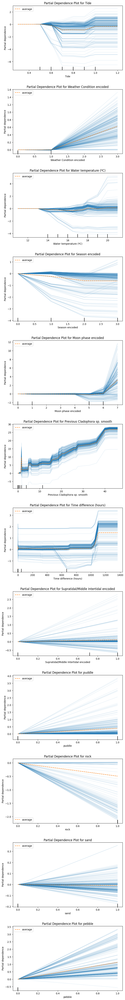

In [ ]:
features = ['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', 'Previous Cladophora sp. smooth', 'Time difference (hours)',
            'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble']

# Generate partial dependence displays
plot_partial_dependence_displays(X_train, y_train, rf_model, features)

In the above PDPs, the previous value of coverage continues to be very important as the correlation and feature importance suggest, a higher previous value usually means a higher present coverage value.
In the substrate PDPs we can observe that the presence of pebbles is more likely to mean a higher coverage than rock, which is consistent with the interpretation of the PDPs of the substrate of the Zone B.

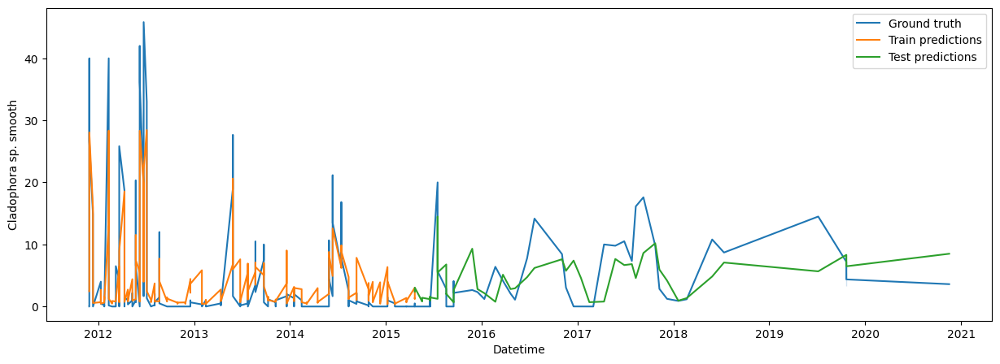

In [ ]:
# Plot predictions vs ground-truth over time

plot_train_test_predictions(rf_model, data, pd.concat([y_train, y_test]), X_train, X_test)

The training prediction attenuates the amplitude of the coverage peaks and the test prediction seems to accurately predict the changes and variations in the coverage of the species.

**Testing previously developed model on unseen data from zone E (supposed to be similar to zone D)**

In [ ]:
# Load data to model
data = pd.read_csv(os.path.join(sessil_data_dir, 'Cladophora_sp_E.csv'))

X = data[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded', 'Previous Cladophora sp. smooth', 'Time difference (hours)',
          'Supratidal/Middle Intertidal encoded', 'puddle',	'rock',	'sand',	'pebble']]
y = data['Cladophora sp. smooth']

R^2 score: 0.42832421594149717


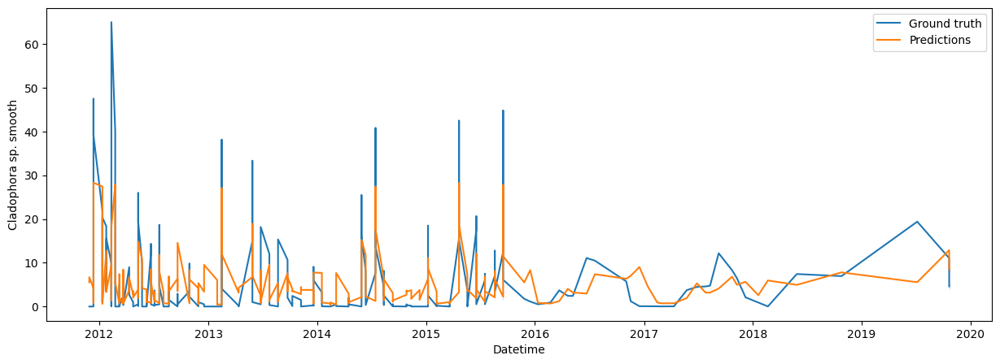

In [ ]:
plot_predictions_unseen_data(rf_model, data, y, X)

The R^2 score in test set of zone D is 0.30, while in the test set of zone E is even higher, so the resulting model seems to generalize to similar zones and to be able to predict the coverage of the species across time.

##### Finally, we trained a model for all the invasive sessil species and endangered mobil species (zones D for train-test and E for test only) and plotted their predictions and features importances.

In [ ]:
invasive_sessil_species = ['Asparagopsis armata', 'Osmundea pinnatifida', 'Cladophora sp.', 'Codium sp.', 'Colpomenia sinuosa']

Asparagopsis armata
Training set R^2 score: 0.7745422566883847
Test set R^2 score: 0.2995001974821736


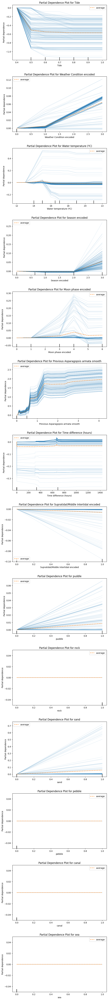

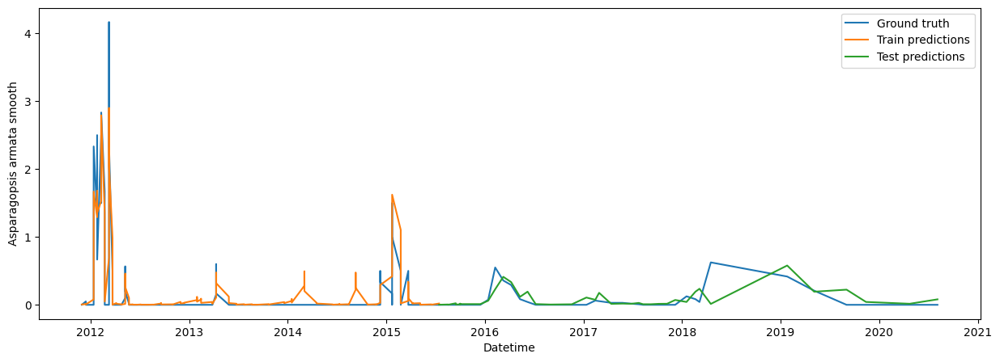

R^2 score: 0.3823759486526149


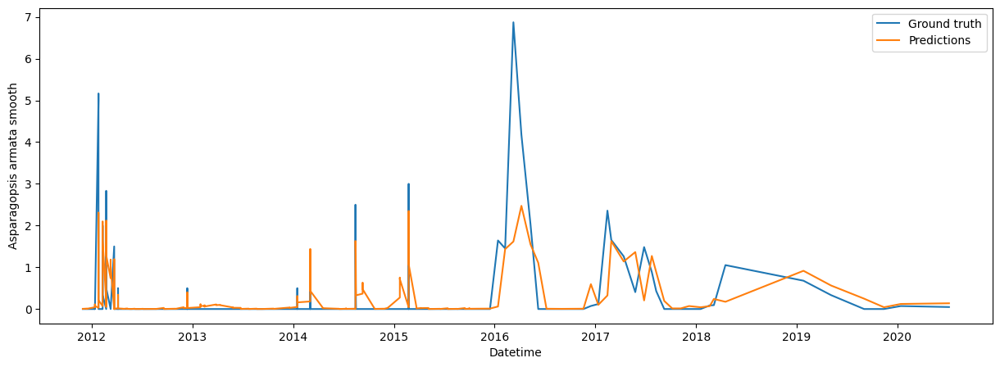

Osmundea pinnatifida
Training set R^2 score: 1.0
Test set R^2 score: 1.0


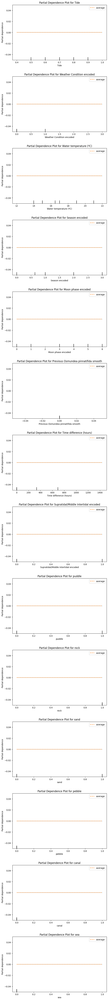

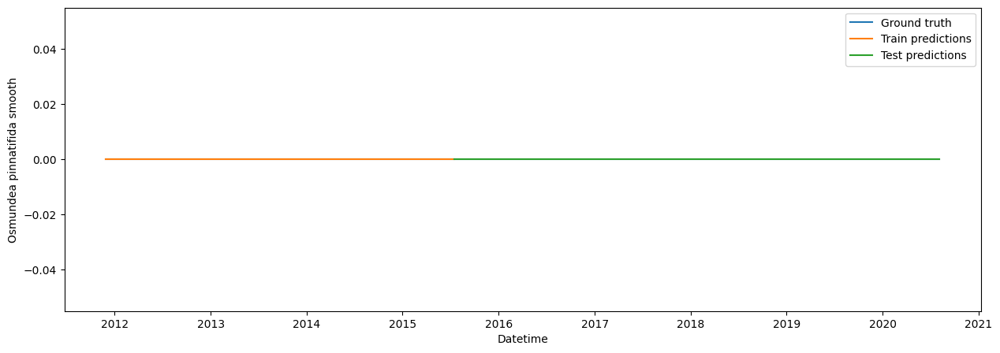

R^2 score: -0.006389776357827781


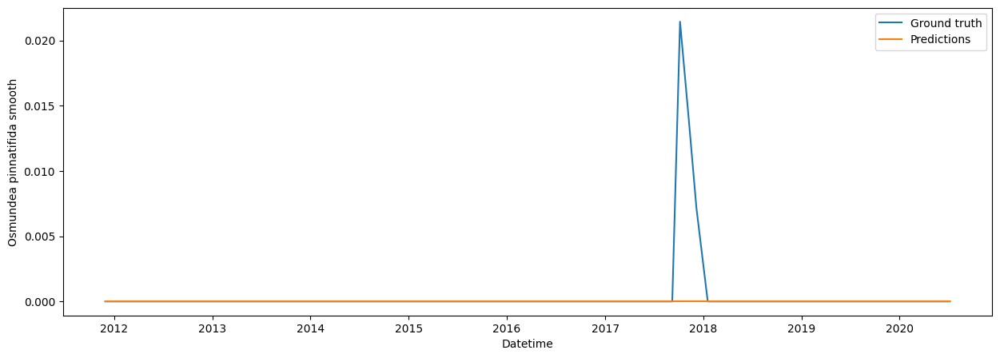

Cladophora sp.
Training set R^2 score: 0.7346479648889058
Test set R^2 score: 0.41729451990765776


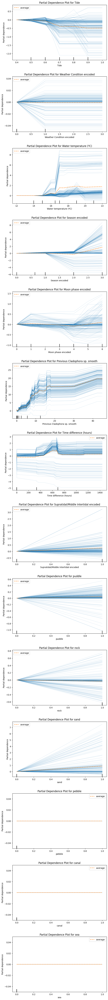

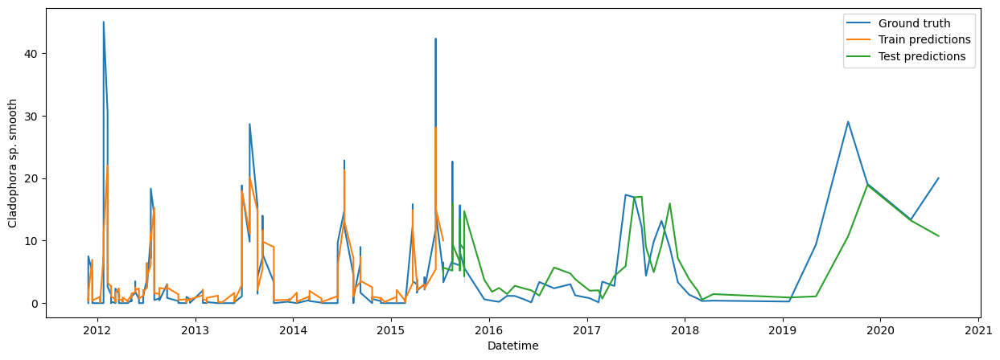

R^2 score: 0.36454612457635727


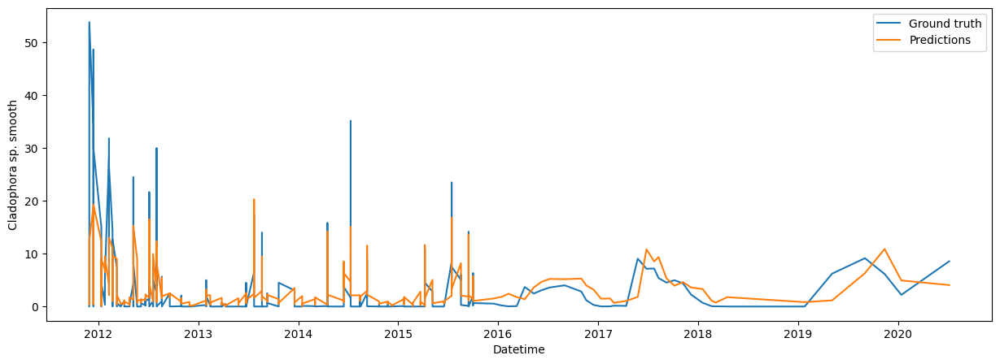

Codium sp.
Training set R^2 score: 0.6910197791510013
Test set R^2 score: -3.6050210488383705


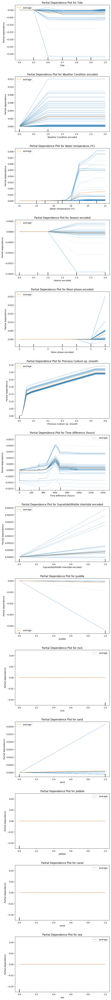

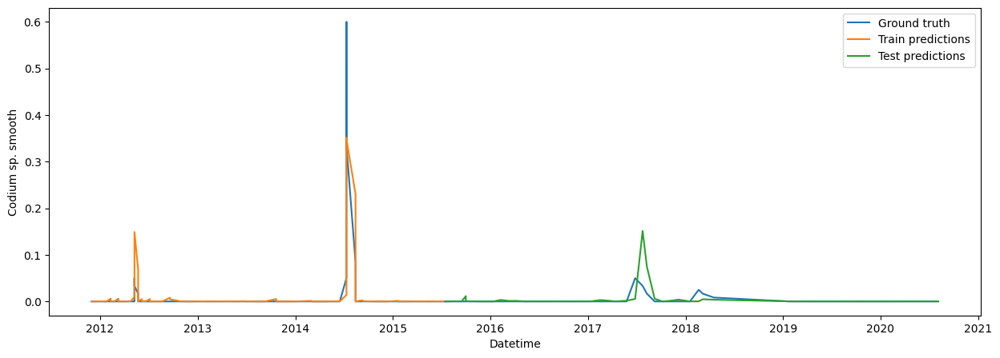

R^2 score: 0.27639073435659245


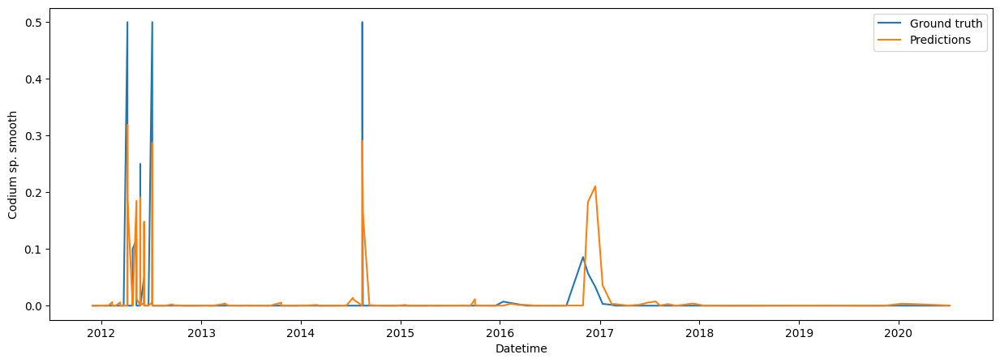

Colpomenia sinuosa
Training set R^2 score: 0.5864345279143433
Test set R^2 score: 0.03214608363778071


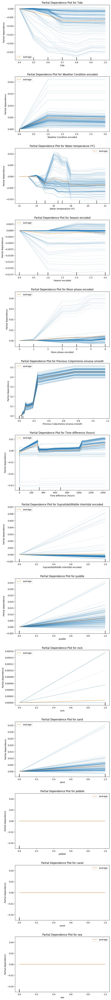

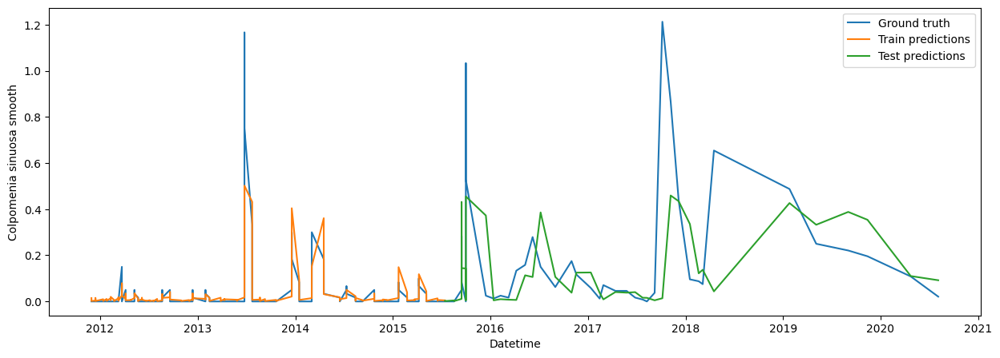

R^2 score: 0.21296740436896755


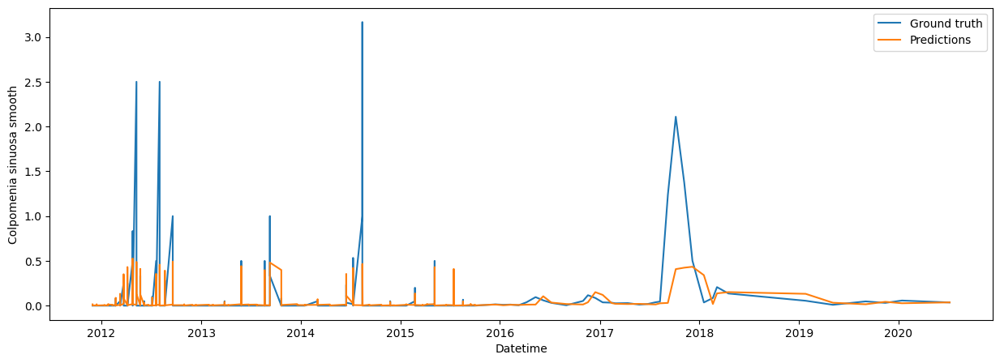

In [ ]:
zone = 'B'
test_zone = 'A'

for specie_name in invasive_sessil_species:
  print(specie_name)
  train_species_pipeline(sessil_data_dir, models_dir, specie_name, zone, test_zone, save_figs=True)

In [ ]:
endangered_mobil_species = ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus', 'Lipophrys pholis', 'Gobius sp.']

Diplodus sp.
Training set R^2 score: 1.0
Test set R^2 score: 1.0


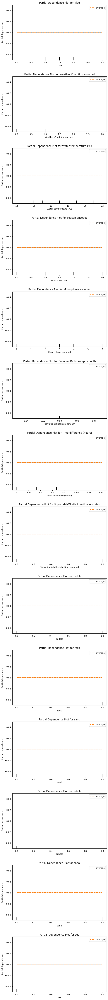

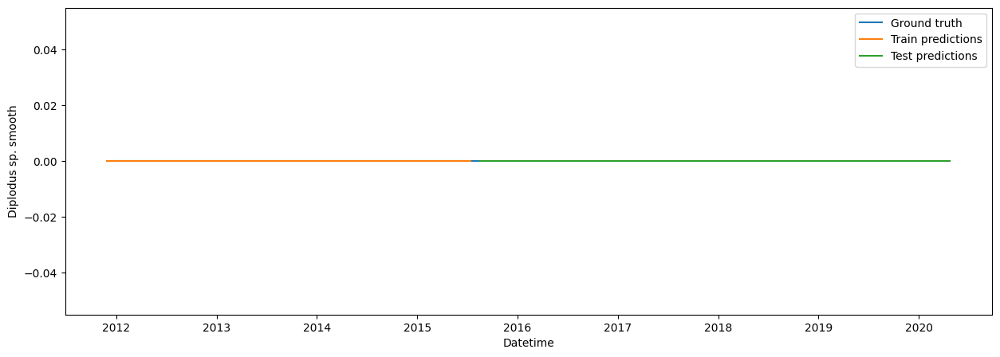

R^2 score: -0.008039859872385202


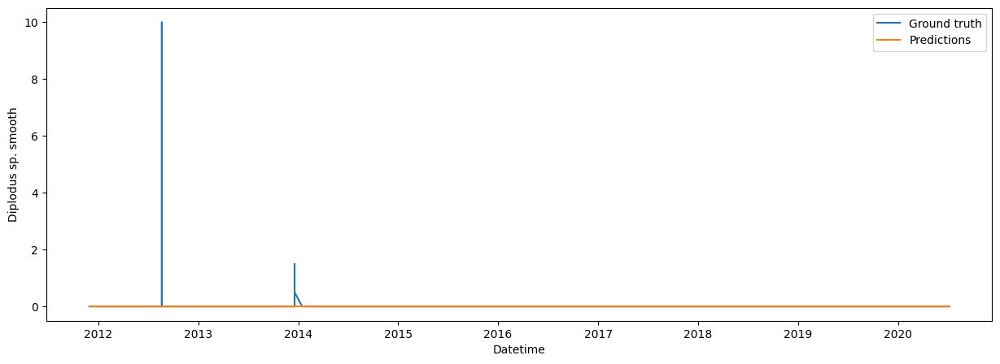

Diplodus sargus
Training set R^2 score: 0.5169518317509563
Test set R^2 score: 0.01056860207184862


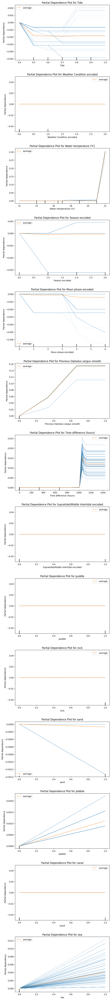

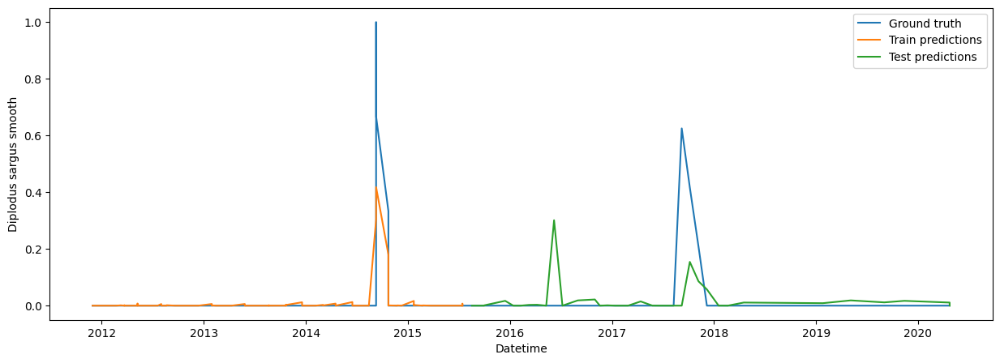

R^2 score: 0.0


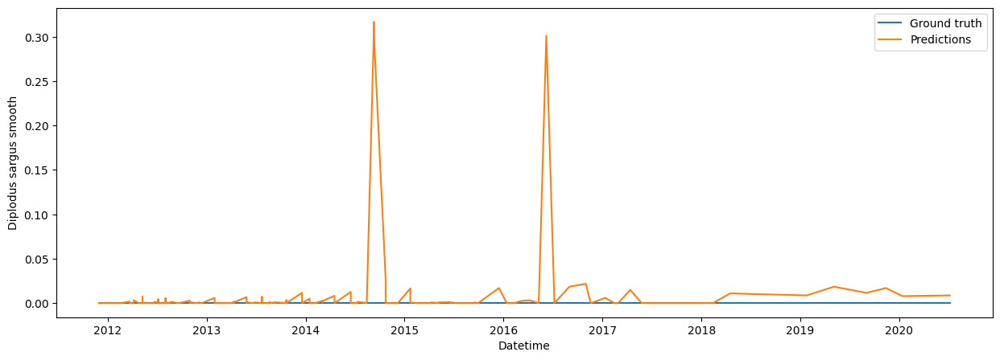

Diplodus vulgaris
Training set R^2 score: 1.0
Test set R^2 score: 1.0


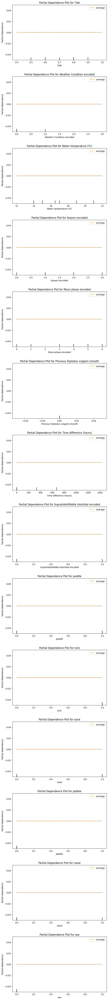

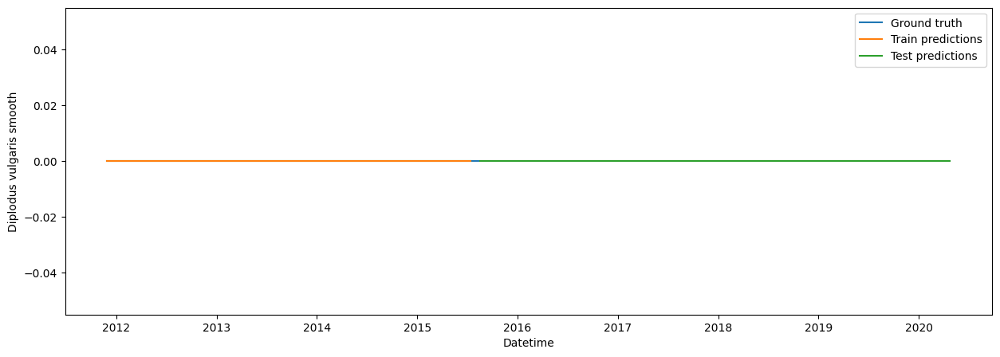

R^2 score: 1.0


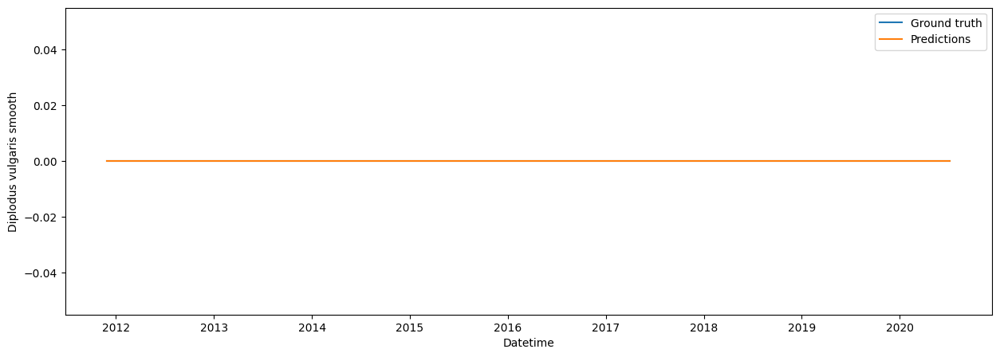

Diplodus cervinus
Training set R^2 score: 1.0
Test set R^2 score: 1.0


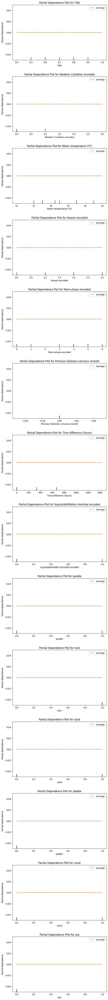

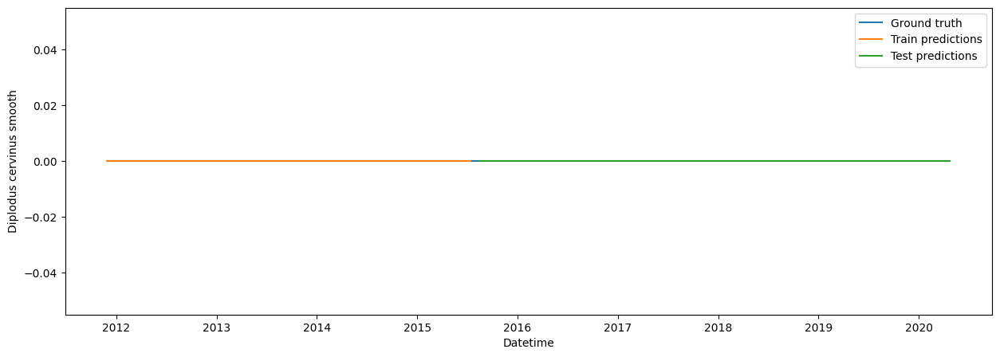

R^2 score: -0.006204756980351389


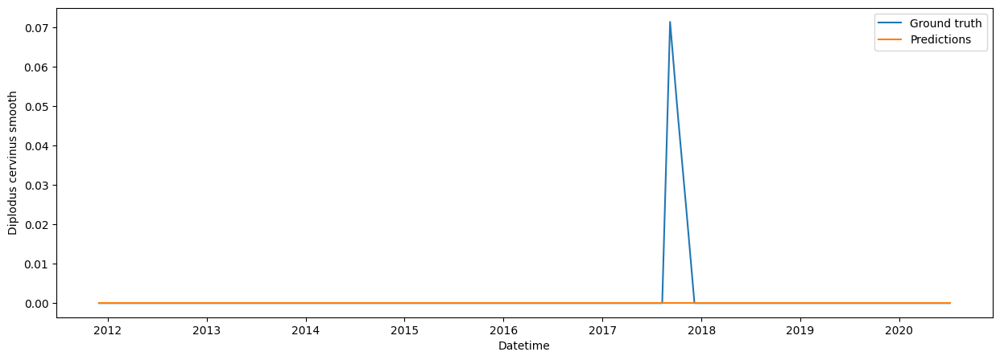

Lipophrys pholis
Training set R^2 score: 1.0
Test set R^2 score: -0.053097345132743445


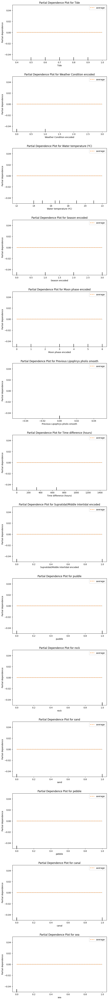

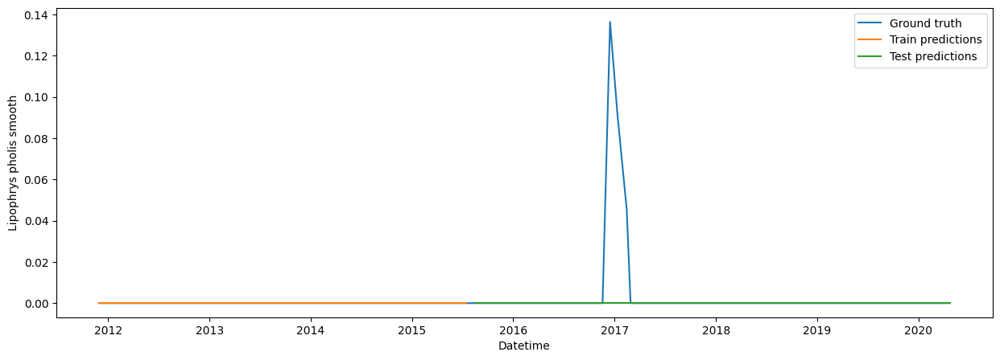

R^2 score: -0.006204756980351611


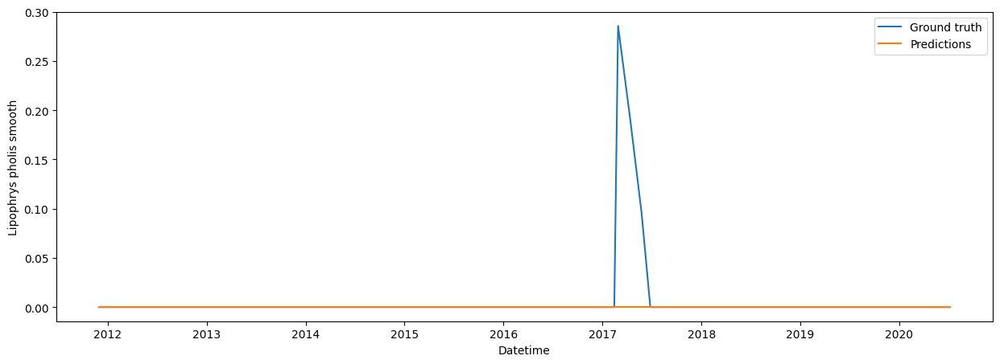

Gobius sp.
Training set R^2 score: 0.5855199633641482
Test set R^2 score: -0.24832164306351023


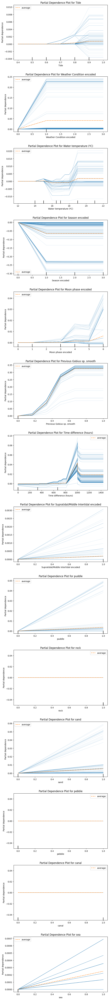

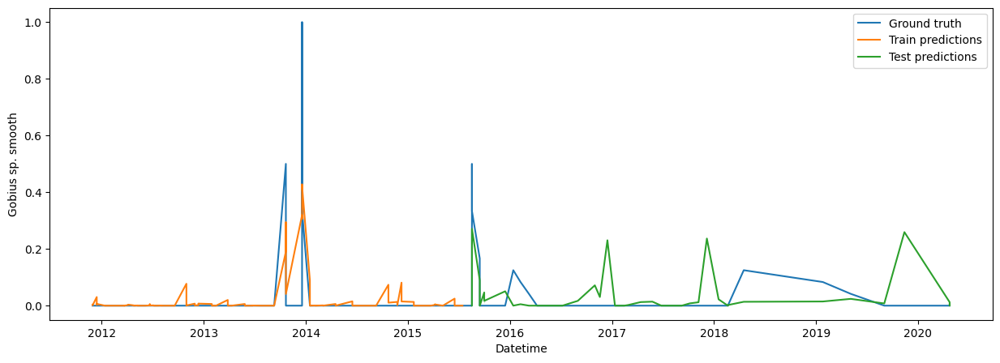

R^2 score: 0.17919186499146422


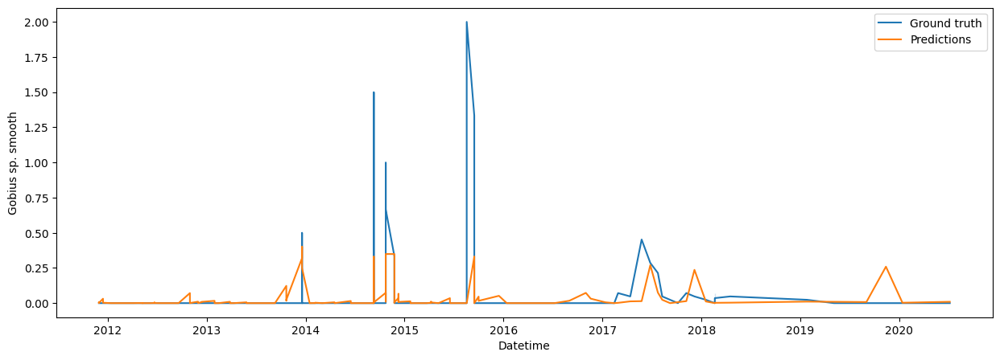

In [ ]:
zone = 'B'
test_zone = 'A'

for specie_name in endangered_mobil_species:
  print(specie_name)
  train_species_pipeline(mobil_data_dir, models_dir, specie_name, zone, test_zone, save_figs=True)

The analysis of the remaining species is not discussed here because the data is more granular and does not contain as much information as the *Cladophora sp.* species to make a proper model. Nonetheless, every PDP and predictions graphs are plotted and saved into the drive.

#### Alternatively, we attempted a more complex Deep Learning approach:

* LSTM followed by fully connected final layers, which input is the previous values observed.
* The multimodal approach which not only applies the LSTM to the previous values observed but also considers 5 of the features gathered, followed by fully connected final layers.

Since the LSTM is highly affected by unequal points spacing, the average time difference between the samples for each year was observed:

*   The minimum time difference for 2011 to 2015 is 0 as there were samples collected withing the same hour.
*   The average time difference varies a lot but there is a clear difference from 2015 to 2016.
*   The maximum time difference also varies a lot but there is a clear difference from 2018 to 2019.

Bearing all of this in mind, only the data up to 2015 (inclusive) were considered for both Deep Learning approaches.

In [ ]:
# Load data to model
filename = os.path.join(sessil_data_dir, 'Cladophora_sp_B.csv')
data = pd.read_csv(filename)

df = pd.DataFrame()
df['Datetime'] = pd.to_datetime(data['Datetime'])
df['Time difference (hours)'] = data['Time difference (hours)']
df['Year'] = 'NaN'
for i, row in df.iterrows():
  df['Year'][i] = row['Datetime'].year
df_aux = pd.DataFrame({'Year': df['Year'].unique(),
                       'Measurements per year': df['Year'].value_counts(),
                       'Min measurements time difference': df.groupby('Year').min()['Time difference (hours)'],
                       'Mean measurements time difference': df.groupby('Year').mean()['Time difference (hours)'],
                       'Max measurements time difference': df.groupby('Year').max()['Time difference (hours)']})
display(df_aux.reset_index().drop(columns='index'))

# Exclude the data of 2016 to the end
rm_indexes = df.index[df['Year'] > 2016].tolist()
data = data.drop(data.index[rm_indexes])

,Year,Measurements per year,Min measurements time difference,Mean measurements time difference,Max measurements time difference
0,2011,7,0.0,51.571429,358.0
1,2012,80,0.0,108.800000,1004.0
2,2013,44,0.0,202.000000,1388.0
3,2014,40,0.0,213.350000,1438.0
4,2015,42,0.0,211.666667,1796.0
5,2016,10,433.0,813.300000,1462.0
6,2017,12,335.0,765.666667,1295.0
7,2018,4,360.0,791.750000,1007.0
8,2019,4,1728.0,3449.750000,6792.0
9,2020,2,2473.0,3179.500000,3886.0


Unimodal model:

Epoch 0: train MSE 1.0196, validation MSE 0.8097
Epoch 100: train MSE 0.9645, validation MSE 0.7622
Epoch 200: train MSE 0.6226, validation MSE 0.4737
Epoch 300: train MSE 0.5360, validation MSE 0.4232
Epoch 400: train MSE 0.4937, validation MSE 0.3894
Epoch 500: train MSE 0.4626, validation MSE 0.3755
Epoch 600: train MSE 0.4534, validation MSE 0.3880
Epoch 700: train MSE 0.4654, validation MSE 0.4198
Epoch 800: train MSE 0.4785, validation MSE 0.4503
Epoch 900: train MSE 0.4876, validation MSE 0.4695


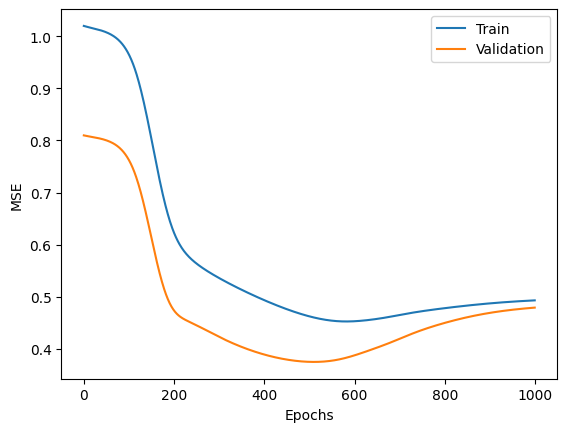

In [ ]:
# Initialize single modality model, optimizer and loss function
lookback=5
model = SingleInputModel(input_size=lookback)
optimizer = optim.Adadelta(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss(reduction='mean')

# Train-test split without shuffling (to respect temporal information)
data_train, data_test = train_test_split(data, test_size=0.2, shuffle=False)
data_test = data_test.reset_index()

# Train-val split without shuffling (to respect temporal information)
data_train, data_val = train_test_split(data_train, test_size=0.2, shuffle=False)
data_val = data_val.reset_index()

# Extract features from data
X_train = y_train = data_train['Cladophora sp. smooth']
X_val = y_val = data_val['Cladophora sp. smooth']
X_test = y_test = data_test['Cladophora sp. smooth']

# Get train-validation dataloaders
train_dataset = SingleInputDataset(y_train, lookback=lookback, standardize_mean=y_train.mean(), standardize_std=y_train.std())
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=False)
val_dataset = SingleInputDataset(y_val, lookback=lookback, standardize_mean=y_train.mean(), standardize_std=y_train.std())
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# Train model
n_epochs = 1000
y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, model = train_dl(model, optimizer, loss_fn, n_epochs, train_loader, val_loader, os.path.join(models_dir, 'lstm_Cladophora_sp_B.pt'))

Best epoch: 510
Train MSE: 0.4604700207710266
Validation MSE: 0.3753429651260376 

Train R^2: 0.5171841053838528
Validation R^2: 0.41101162576304695
Test R^2: 0.4191778251076551


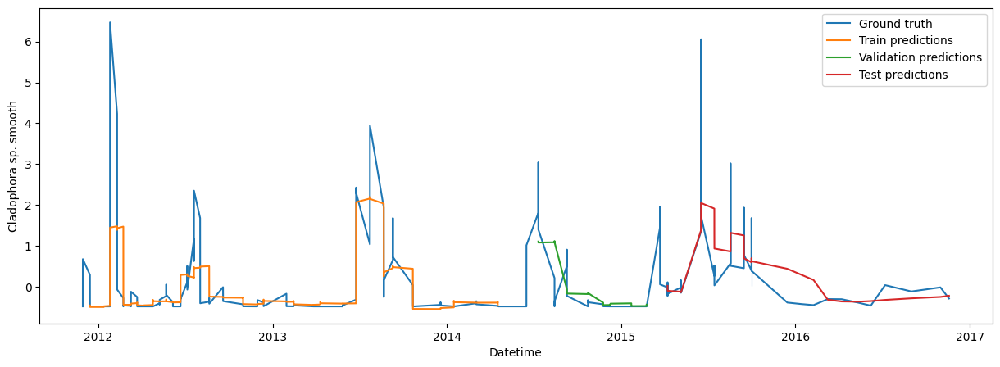

In [ ]:
# Get test dataloader
test_dataset = SingleInputDataset(y_test, lookback=lookback, standardize_mean=y_train.mean(), standardize_std=y_train.std())
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# Print metrics and plot ground-truth vs predictions
plot_dl_results(os.path.join(models_dir, 'lstm_Cladophora_sp_B.pt'), model, test_loader, y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, data)

Despite appearing that it is not able to fit the peaks of the data, this model shows a better generalization in comparison to the Machine Learning model presented above, showing a slightly higher test score (and much closer to the train and validation scores).

Multimodal model:

Epoch 0: train MSE 1.0509, validation MSE 0.8227
Epoch 100: train MSE 0.9184, validation MSE 0.6862
Epoch 200: train MSE 0.8632, validation MSE 0.6652
Epoch 300: train MSE 0.6213, validation MSE 0.4634
Epoch 400: train MSE 0.5173, validation MSE 0.3907
Epoch 500: train MSE 0.4801, validation MSE 0.3639
Epoch 600: train MSE 0.4581, validation MSE 0.3553
Epoch 700: train MSE 0.4545, validation MSE 0.3683
Epoch 800: train MSE 0.4588, validation MSE 0.3884
Epoch 900: train MSE 0.4695, validation MSE 0.4188


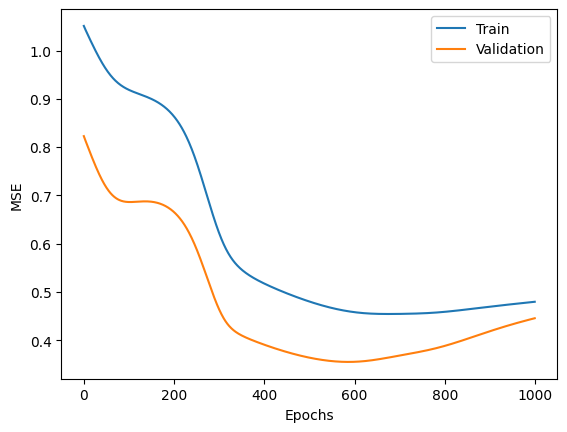

In [ ]:
# Initialize multi-modality model, optimizer and loss function
lookback=5
model = MultiInputModel(n_features=5, input_size=lookback)
optimizer = optim.Adadelta(model.parameters(), lr=0.01)
loss_fn = nn.MSELoss(reduction='mean')

# Train-test split without shuffling (to respect temporal information)
data_train, data_test = train_test_split(data, test_size=0.2, shuffle=False)
data_test = data_test.reset_index()

# Train-validation split without shuffling (to respect temporal information)
data_train, data_val = train_test_split(data_train, test_size=0.2, shuffle=False)
data_val = data_val.reset_index()

# Extract features from data
X_train = data_train[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded']]
y_train = data_train['Cladophora sp. smooth']
X_val = data_val[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded']]
y_val = data_val['Cladophora sp. smooth']
X_test = data_test[['Tide', 'Weather Condition encoded', 'Water temperature (ºC)', 'Season encoded', 'Moon phase encoded']]
y_test = data_test['Cladophora sp. smooth']

# Calculate means and stds for each train feature/target
means = [y_train.mean()]
features_means = X_train.mean().to_list()
for mean in features_means:
  means.append(mean)
stds = [y_train.std()]
features_stds = X_train.std().to_list()
for std in features_stds:
  stds.append(std)

# Get train-validation dataloaders
train_dataset = MultiInputDataset(X_train, y_train, lookback=lookback, standardize_means=means, standardize_stds=stds)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=False)
val_dataset = MultiInputDataset(X_val, y_val, lookback=lookback, standardize_means=means, standardize_stds=stds)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# Train model
n_epochs = 1000
y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, model = train_dl_multimodal(model, optimizer, loss_fn, n_epochs, train_loader, val_loader, os.path.join(models_dir, 'multimodal_Cladophora_sp_B.pt'))

Best epoch: 586
Train MSE: 0.45994123816490173
Validation MSE: 0.35508039593696594 

Train R^2: 0.5306068804845834
Validation R^2: 0.4526745938521717
Test R^2: 0.41231924196565484


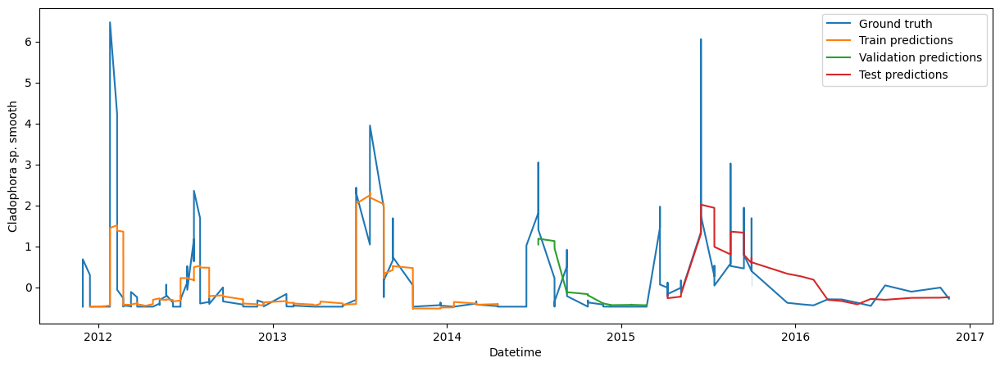

In [ ]:
# Get test dataloader
test_dataset = MultiInputDataset(X_test, y_test, lookback=lookback, standardize_means=means, standardize_stds=stds)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# Print metrics and plot ground-truth vs predictions
plot_dl_results(os.path.join(models_dir, 'multimodal_Cladophora_sp_B.pt'), model, test_loader, y_train_final, y_pred_train_final, y_val_final, y_pred_val_final, data, modality='multi')

The intuition behind developing this model was that the results could benefit from additional and meaningful features. The results indeed showed a slight increase in performance in the train and validation set which in the end is not very meaningful since in the test set the performance is very similar.

As seen in the Machine Learning approach, the feature that was given a significantly higher importance was the previous value. It is assumed that the same is happening with the LSTM, with a much higher importance being given to the first modality (previous samples, what is refered as 'signal'). However, being a 'black box' model, it is not possible to analyse this without interpretability factors being taken into account.

## 🖼️ Visualisations


Data problems: https://drive.google.com/file/d/1M-9U8eZ4auN-BZXyz_0C7MDpguh2darM/view?usp=sharing

## 👓 References

[1] PyEphem documentation: https://rhodesmill.org/pyephem/quick.html

[2] IUCN: https://www.iucnredlist.org/

[3] The Effects of the Moon Phases on Ocean Tides: https://sciencing.com/tide-corresponds-solar-eclipse-3392.html?fbclid=IwAR1KfltBZFUXA1EjvSRho3S45nkwPeT1redX93FM6Huy324cm5oMQCt4tGc

## ⏭️ Appendix


Something that was provided during this challenge was a shape file containing the sea elevation throughout the AMPA. In the end, this data was not used since there was no way to map it to each zone until the very end of the challenge, when these files were provided. Nevertheless, below follows the code used to perform this visualization.

In [ ]:
# Requirements

!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Imports

import geopandas as gpd
import matplotlib.pyplot as plt

In [ ]:
# Load shapefile data

shapefile_path = '/content/drive/My Drive/WDL/Semi-Finals/Data/bathymetry/Base_batimetrica.shp'
shapefile_data = gpd.read_file(shapefile_path)

In [ ]:
# View data information
shapefile_data.head()

,OBJECTID,Layer,Color,Elevation,Text_,Cota,Shape_Leng,geometry
0,1,Batimétrica,253,-2.08,Nm,-2.08,817.475353,"LINESTRING Z (-113786.504 -107221.018 -2.080, ..."
1,3,Batimétrica,253,-2.08,Nm,-2.08,1273.857339,"LINESTRING Z (-117611.698 -105170.752 -2.080, ..."
2,5,Batimétrica,253,-2.08,Nm,-2.08,540.255327,"LINESTRING Z (-116325.596 -106670.428 -2.080, ..."
3,7,Batimétrica,253,-2.08,Nm,-2.08,356.953051,"LINESTRING Z (-117208.248 -106080.916 -2.080, ..."
4,9,Batimétrica,253,-2.08,Nm,-2.08,143.034819,"LINESTRING Z (-117563.211 -105801.097 -2.080, ..."


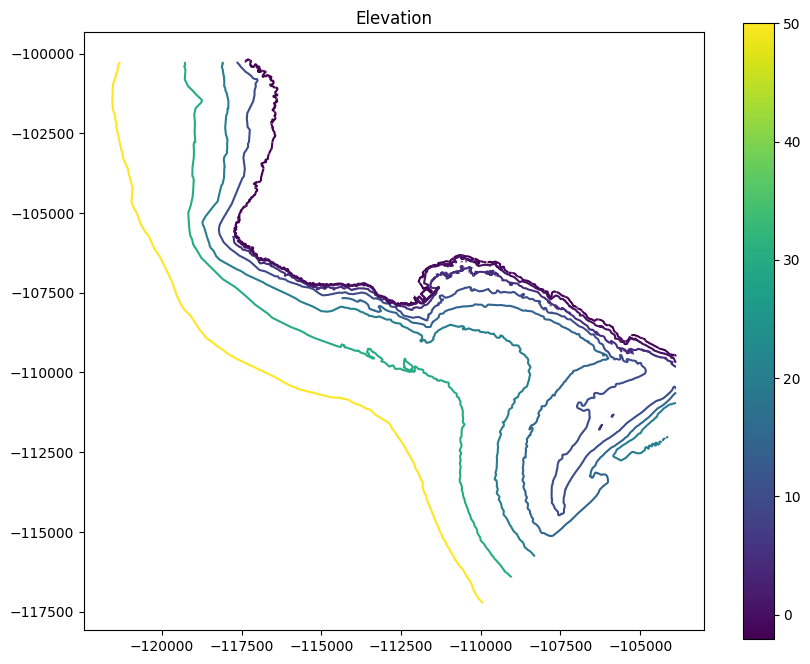

In [ ]:
# Plot elevation information
shapefile_data.plot('Elevation', legend=True, figsize=(10, 8))
plt.title('Elevation');

As mentioned above, smoothing the data helps the model as it removes sudden spikes, making it easier for the model to detect abundance peaks. To do so, we previously used a sliding window method, that gives the same weight to all of the samples. However, this might be improved, since we can modulate the impact of the samples in the smoothing process, based on their time difference from current sample. In other words, a sample that is 1 week apart should weight less in the average than a sample 15 minutes away from the current sample, since it is able to describe more approximately the behavior in the present moment.

To achieve this, we implemented an exponential function that tends to zero the bigger the time interval between samples is.

In [ ]:
def weighted_smoothing(time_series, values, width=3):
  # Final outputs of the function
  time_diffs = list()
  weights = list()
  time_series_smooth = list()

  # With a sliding window method, create a weighted average of the sample, based on
  #the current and previous 2 samples, based on the time interval between samples
  for ii in range(width-1, len(time_series)):

    curr_time = time_series[ii]
    window_time = time_series[(ii-width+1):ii+1] # creates window
    window_time = window_time.tolist()

    win_weights=[]
    sum_weights=0
    inter = []

    # For each window, gets the time intervals between the current and previous samples and fits the delta into an exponential that tends to zero
    # This means that the older the last sample is, less relevant it is to the current value, i.e., lower weight.
    for i in range(width-1,-1,-1):#inverse order
      previous_time = window_time[i]
      # print('{} - {}'.format(curr_time,previous_time))
      time_interval = curr_time-previous_time
      interval_seconds = time_interval.total_seconds()
      inter.append(interval_seconds)

      # The time interval between samples varies a lot from 600 sec to millions. Therefore, there are 2 curves depending if the time interval is
      # outstandingly high or not. The 'alpha' is the decay factor
      if interval_seconds <= 250000:
        alpha = 0.9999
      else:
        alpha = 0.999997

      weight = alpha**interval_seconds
      win_weights.append(weight)
      sum_weights += weight

    # Normalize weights to ensure sum within the window is 1
    normalized_weights = [win_weights[_] / sum_weights for _ in range(width-1,-1,-1) if _ >= 0]
    time_diffs.append(list(reversed(inter)))
    weights.append(normalized_weights)

    # Performing the weighted summation
    smooth_value=0
    for ind in range(width):
      smooth_value += values[ii-(width-1-ind)]*normalized_weights[ind]
    time_series_smooth.append(smooth_value)

  # Padding the beginning of the dataframe, as the window prevents the first values from being used
  for jj in range(width-1):
    time_diffs.insert(jj, 'NaN')
    weights.insert(jj, 'NaN')
    time_series_smooth.insert(jj, values[jj])

  return time_diffs, weights, time_series_smooth

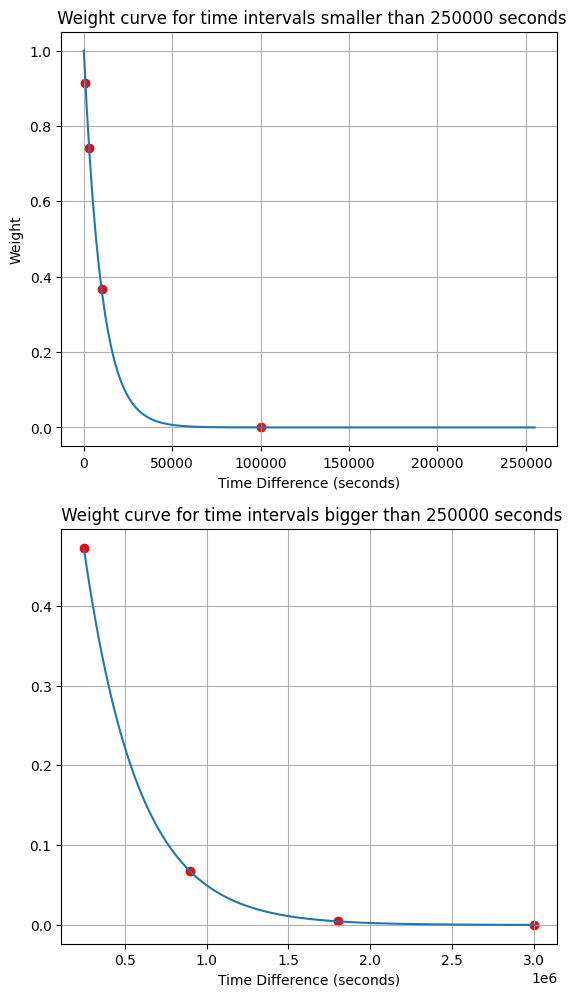

In [ ]:
# For demonstrations purposes, let's imagine we have the following time differences in seconds

time_diffs = [900, 3000, 10000, 100000, 250000, 900000, 1800000, 3000000] # this values are in the same order of magnitude of the ones in the database

# Plot the curve
plt.subplot(2, 1, 1)
time_diff_line = np.linspace(0, 255000, 150)
weights_line = [0.9999**value for value in time_diff_line] # difference <= 250000
plt.plot(time_diff_line, weights_line)

weights = [0.9999**value for value in time_diffs[0:4]]# difference <= 250000
plt.scatter(time_diffs[0:4], weights, color='r')

plt.xlabel('Time Difference (seconds)')
plt.ylabel('Weight')
plt.title(' Weight curve for time intervals smaller than 250000 seconds')
plt.grid(True)
# plt.show()


plt.subplot(2, 1, 2)
time_diff_line = np.linspace(250000, 3005000, 150)
weights_line = [0.999997**value for value in time_diff_line] # difference > 250000
plt.plot(time_diff_line, weights_line)

weights = [0.999997**value for value in time_diffs[4:]]# difference > 250000
plt.scatter(time_diffs[4:], weights, color='r')

plt.xlabel('Time Difference (seconds)')
plt.title(' Weight curve for time intervals bigger than 250000 seconds')
plt.grid(True)

plt.subplots_adjust(bottom=0.1, top=2)
plt.show()

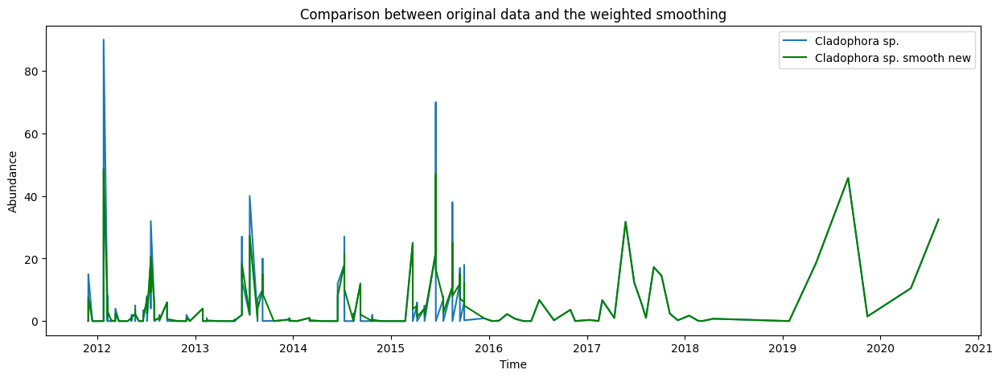

In [ ]:
# Applying this to the Cladophora sp data

data_dir = '/content/drive/My Drive/WDL/Semi-Finals/Data'
sessil_data_dir = os.path.join(data_dir, 'sessil')
mobil_data_dir = os.path.join(data_dir, 'mobil')

filename = os.path.join(sessil_data_dir, 'Cladophora_sp_B.csv')
data = pd.read_csv(filename)
data = data[['Datetime', 'Cladophora sp.']]
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Time diffs new'], data['Weights new'], data['Cladophora sp. smooth new'] = weighted_smoothing(data['Datetime'], data['Cladophora sp.'], 3)

plt.figure(figsize=(15, 5))
sns.lineplot(x=pd.to_datetime(data['Datetime']), y=data['Cladophora sp.'], label='Cladophora sp.')
sns.lineplot(x=pd.to_datetime(data['Datetime']), y=data['Cladophora sp. smooth new'], label='Cladophora sp. smooth new', color='g')
plt.xlabel('Time')
plt.ylabel('Abundance')
plt.title('Comparison between original data and the weighted smoothing')
plt.show()

As we can see, the weighted averages work since the data is smoothed in the years prior to 2015, where we have a smaller temporal granularity. However, in the years after, the samples were taken with less frequency, so the weights given to prior instances are smaller, rendering the average values very similar to the current values.

Although this makes the data more appropriate, as it solves the time shifts, it did not achieve good results when applied in the machine and deep learning approaches.

-----

# In the end, at CEOS, our objective was to evaluate the behaviour of the species and their abundance over time, comprehending what are the key factors that influence their growth. When combining all these sections, we definitely achieve a greater value, as we can gather and predict new information, estimating what will be the abundance values according to multiple environmental features in the future, together with insights regarding each of the species.

